# Evaluation Project:Global PowerPlant Databse

# Evaluation Project: subpart 1

# Global Power Plant Classification Predictive Analysis, Model Development, Model Evaluation and Model Selection Project

# Problem Statement

# Global Power Plant is a classification based problem statement to classify primary fuel from several indicators. The Database is a comprehensive, open source database of power plants around the world. It centralizes power plant data to make it easier to navigate, compare and draw insights for one’s own analysis. The database covers approximately 35,000 power plants from 167 countries and includes thermal plants (e.g. coal, gas, oil, nuclear, biomass, waste, geothermal) and renewables (e.g. hydro, wind, solar). Each power plant is geolocated and entries contain information on plant capacity, generation, ownership, and fuel type. It will be continuously updated as data becomes available

# Importing Data From Github repository /wri/global-power-plant-database/blob/master/source_databases_csv/database_IND.csv

In [2]:
# Importing Required Libraries And Data

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('https://raw.githubusercontent.com/wri/global-power-plant-database/master/source_databases_csv/database_IND.csv')
data1=data.copy()  # creating a copy of dataframe
data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.5,28.1839,73.2407,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.0,24.7663,74.6090,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.2,21.9038,69.3732,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.0,23.8712,91.3602,Gas,NaN,NaN,...,2019.0,NaN,617.789264,843.747000,886.004428,663.774500,626.239128,NaN,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.370000,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,IND,India,YERMARUS TPP,IND0000513,1600.0,16.2949,77.3568,Coal,Oil,NaN,...,2019.0,NaN,NaN,0.994875,233.596650,865.400000,686.500000,NaN,Central Electricity Authority,NaN
903,IND,India,Yelesandra Solar Power Plant,WRI1026222,3.0,12.8932,78.1654,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
904,IND,India,Yelisirur wind power project,WRI1026776,25.5,15.2758,75.5811,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
905,IND,India,ZAWAR MINES,WRI1019901,80.0,24.3500,73.7477,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# I have created 2 datsets, data1 for timeseries analysis ans anomalies; data for predictive analysis.

In [4]:
data['primary_fuel'].unique(), len(data['primary_fuel'].unique())

(array(['Solar', 'Coal', 'Wind', 'Gas', 'Hydro', 'Biomass', 'Oil',
        'Nuclear'], dtype=object),
 8)

In [5]:
# Observation 1
shape_of_data=data.shape
print('Number Of Rows: ',shape_of_data[0], 'Number Of Columns: ', shape_of_data[1])

Number Of Rows:  907 Number Of Columns:  27


In [6]:
data.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh'],
      dtype='object')

In [7]:
# Checking column names to detect unnamed columns

In [8]:
print('Type of storage of data ', type(data), '\nType of data series ', type(data.columns))

Type of storage of data  <class 'pandas.core.frame.DataFrame'> 
Type of data series  <class 'pandas.core.indexes.base.Index'>


In [9]:
data.isna().any()

country                     False
country_long                False
name                        False
gppd_idnr                   False
capacity_mw                 False
latitude                     True
longitude                    True
primary_fuel                False
other_fuel1                  True
other_fuel2                  True
other_fuel3                  True
commissioning_year           True
owner                        True
source                      False
url                         False
geolocation_source           True
wepp_id                      True
year_of_capacity_data        True
generation_gwh_2013          True
generation_gwh_2014          True
generation_gwh_2015          True
generation_gwh_2016          True
generation_gwh_2017          True
generation_gwh_2018          True
generation_gwh_2019          True
generation_data_source       True
estimated_generation_gwh     True
dtype: bool

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 907 entries, 0 to 906
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   907 non-null    object 
 1   country_long              907 non-null    object 
 2   name                      907 non-null    object 
 3   gppd_idnr                 907 non-null    object 
 4   capacity_mw               907 non-null    float64
 5   latitude                  861 non-null    float64
 6   longitude                 861 non-null    float64
 7   primary_fuel              907 non-null    object 
 8   other_fuel1               198 non-null    object 
 9   other_fuel2               1 non-null      object 
 10  other_fuel3               0 non-null      float64
 11  commissioning_year        527 non-null    float64
 12  owner                     342 non-null    object 
 13  source                    907 non-null    object 
 14  url       

In [11]:
data.isna().values.any()

True

In [12]:
data.isnull().values.sum()

10445

In [13]:
data_1=data.select_dtypes(object).fillna('None')
data_2=data.select_dtypes(np.number).fillna(method='backfill')
data_2=data_2.fillna(0)
del data
data=pd.concat([data_1, data_2], axis=1)
data.isna().values.any()

False

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 907 entries, 0 to 906
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   907 non-null    object 
 1   country_long              907 non-null    object 
 2   name                      907 non-null    object 
 3   gppd_idnr                 907 non-null    object 
 4   primary_fuel              907 non-null    object 
 5   other_fuel1               907 non-null    object 
 6   other_fuel2               907 non-null    object 
 7   owner                     907 non-null    object 
 8   source                    907 non-null    object 
 9   url                       907 non-null    object 
 10  geolocation_source        907 non-null    object 
 11  generation_data_source    907 non-null    object 
 12  capacity_mw               907 non-null    float64
 13  latitude                  907 non-null    float64
 14  longitude 

In [15]:
data.isnull().values.sum()

0

In [16]:
data.dtypes, len(data.dtypes)

(country                      object
 country_long                 object
 name                         object
 gppd_idnr                    object
 primary_fuel                 object
 other_fuel1                  object
 other_fuel2                  object
 owner                        object
 source                       object
 url                          object
 geolocation_source           object
 generation_data_source       object
 capacity_mw                 float64
 latitude                    float64
 longitude                   float64
 other_fuel3                 float64
 commissioning_year          float64
 wepp_id                     float64
 year_of_capacity_data       float64
 generation_gwh_2013         float64
 generation_gwh_2014         float64
 generation_gwh_2015         float64
 generation_gwh_2016         float64
 generation_gwh_2017         float64
 generation_gwh_2018         float64
 generation_gwh_2019         float64
 estimated_generation_gwh    float64
 

# Tabulated Conclusion Of Data Cleaning

In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 907 entries, 0 to 906
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   907 non-null    object 
 1   country_long              907 non-null    object 
 2   name                      907 non-null    object 
 3   gppd_idnr                 907 non-null    object 
 4   primary_fuel              907 non-null    object 
 5   other_fuel1               907 non-null    object 
 6   other_fuel2               907 non-null    object 
 7   owner                     907 non-null    object 
 8   source                    907 non-null    object 
 9   url                       907 non-null    object 
 10  geolocation_source        907 non-null    object 
 11  generation_data_source    907 non-null    object 
 12  capacity_mw               907 non-null    float64
 13  latitude                  907 non-null    float64
 14  longitude 

In [19]:
data1=data.copy() #updating changes in data1

# # Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:
1. The dataset had 10445 missing values, that I have filled with default values and backfill methods, where applicable. The dataset does not have missing values now.
2. The whole dataset is of 907 rows *27 columns shape, hence, chances of overerfitting, that is, model getting trained more than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
3. There are 15 continuous columns and 12 categorical columns, hence, encoding is required.

# EDA

# Count Plots Of Categorical Values


<Figure size 21600x21600 with 0 Axes>

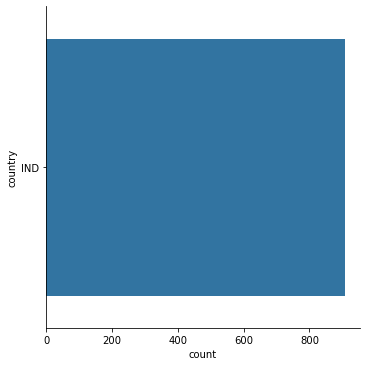

<Figure size 21600x21600 with 0 Axes>

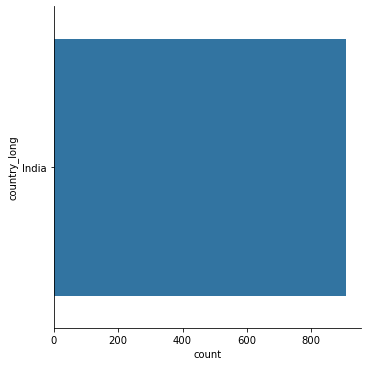

<Figure size 21600x21600 with 0 Axes>

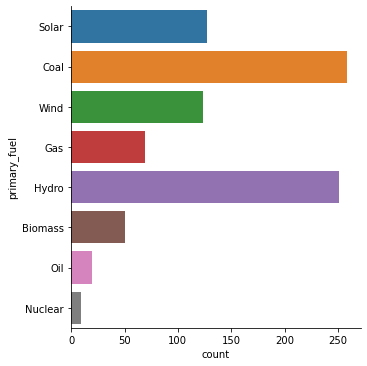

<Figure size 21600x21600 with 0 Axes>

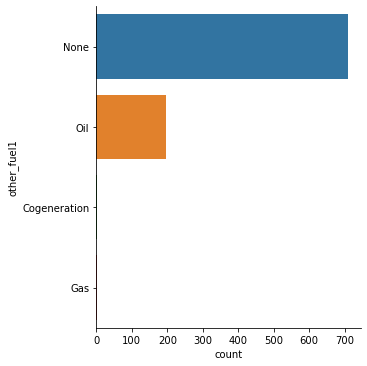

<Figure size 21600x21600 with 0 Axes>

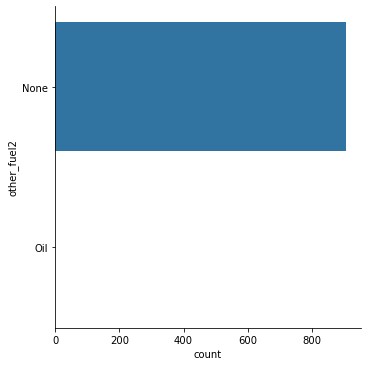

<Figure size 21600x21600 with 0 Axes>

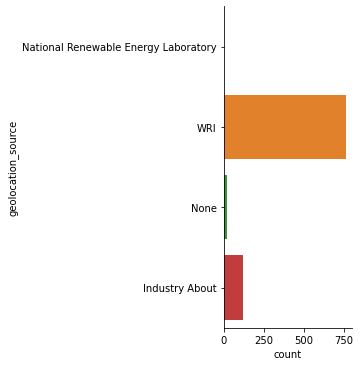

<Figure size 21600x21600 with 0 Axes>

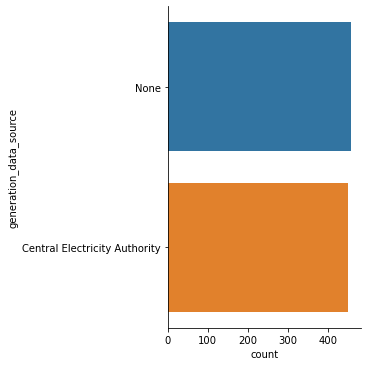

In [23]:
import plotly.express as px
for x in data1.select_dtypes(object).columns:
#    if x!='generation_gwh_2018'or x!='generation_gwh_2017','generation_gwh_2016','generation_gwh_2015','generation_gwh_2014', 'name']:
    if x=='name' or x=='generation_gwh_2014'or x=='generation_gwh_2015' or x=='generation_gwh_2018' or x=='generation_gwh_2017' or x=='generation_gwh_2016' or x=='gppd_idnr' or x=='latitude' or x=='longitude' or x=='commissioning_year' or x=='owner' or x=='source' or x=='url': 
        fig=px.bar(data1, y=x)
        fig.show()
    else:
        plt.figure(figsize=(300,300))
        sns.catplot(y=x, kind='count', data=data1, margin_titles=True)
        plt.show()

# Tabulated Analysis Of Above Countplots


In [19]:
object_description=data1.select_dtypes(object).describe()
object_description=object_description.rename(index={'count':'count of values', 'unique':'unique values', 'top':'most frequent value', 'freq':'frequency of most frequent value'})
dict1=object_description.iloc[0,:]-object_description.iloc[3,:]
object_description1=pd.concat([object_description, pd.DataFrame(dict1).T])
object_description1=object_description1.rename(index={0:'count of remaining values'})
object_description1

,country,country_long,name,gppd_idnr,primary_fuel,other_fuel1,other_fuel2,owner,source,url,geolocation_source,generation_data_source
count of values,907,907,907,907,907,907,907,907,907,907,907,907
unique values,1,1,907,907,8,4,2,281,191,304,4,2
most frequent value,IND,India,MANGAON CCPP,IND0000387,Coal,None,None,None,Central Electricity Authority,http://www.cea.nic.in/,WRI,None
frequency of most frequent value,907,907,1,1,258,709,906,565,519,519,765,458
count of remaining values,0,0,906,906,649,198,1,342,388,388,142,449


# Verbal Translation Of Above Table

# Anomalies Detected
1. There are 12 categorical features: country, country_long, name, gppd_idnr, primary_fuel,
       other_fuel1, other_fuel2, owner, source, url,
       geolocation_source and generation_data_source
2. There are 907 unique values in: name and gppd_idnr, 
3. There are 2 unique values in: other fuel 2 and generation datasource.
4. There are 54 unique values in region.
5. All the records are from India across 4 geolocation source.
6. Other fuel 2 occured once across 907 data points.
8. WRI is the most popular geolocation source.
9. Central Electricity Authority is the source for 191 records.
10. Primary fuel is categorized into 8 of which most popular is coal.

In [36]:
import cufflinks as cf
cf.set_config_file(offline=True)
eda_data=data.copy()
eda_data=eda_data.set_index('commissioning_year')
eda_data=eda_data.sort_index()
eda_data[4:]['capacity_mw'].iplot(title='Time Series View Of Capacity MW')

# Anomalies Detected
## 1. year 2002 of plant operation observed maximum electrical generating capacity of 4760 mw.

## 2. year 1953 of plant operation observed minimum electrical generating capacity of 4 mw.

## 3. Standard deviation in electrical generation capacity from 1930 to 2010 has been 590 mw.

## 4. On an average, 326 mw of electricity got generated each year.

## 5. Median has been 59 mw.

## 6. 75% distribution observed 385 electricity generation.

# Dataset Visualization                                                                                                     

# Head View

In [30]:
data1.head()

,country,country_long,name,gppd_idnr,primary_fuel,other_fuel1,other_fuel2,owner,source,url,...,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,Solar,None,None,Solar Paces,National Renewable Energy Laboratory,http://www.nrel.gov/csp/solarpaces/project_det...,...,0.0,2019.0,0.0,617.789264,843.747,886.004428,663.774500,626.239128,0.0,0.0
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,Coal,None,None,Ultratech Cement ltd,Ultratech Cement ltd,http://www.ultratechcement.com/,...,0.0,2019.0,0.0,617.789264,843.747,886.004428,663.774500,626.239128,0.0,0.0
2,IND,India,AES Saurashtra Windfarms,WRI1026669,Wind,None,None,AES,CDM,https://cdm.unfccc.int/Projects/DB/DNV-CUK1328...,...,0.0,2019.0,0.0,617.789264,843.747,886.004428,663.774500,626.239128,0.0,0.0
3,IND,India,AGARTALA GT,IND0000001,Gas,None,None,None,Central Electricity Authority,http://www.cea.nic.in/,...,0.0,2019.0,0.0,617.789264,843.747,886.004428,663.774500,626.239128,0.0,0.0
4,IND,India,AKALTARA TPP,IND0000002,Coal,Oil,None,None,Central Electricity Authority,http://www.cea.nic.in/,...,0.0,2019.0,0.0,3035.550000,5916.370,6243.000000,5385.579736,7279.000000,0.0,0.0


# The above table represents first five rows of original dataset

# Sample View


In [33]:
data1.sample()

,country,country_long,name,gppd_idnr,primary_fuel,other_fuel1,other_fuel2,owner,source,url,...,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,estimated_generation_gwh
874,IND,India,VENUNAGAR SUGAR,WRI1019993,Biomass,None,None,Shri Ssk ltd,Shri Ssk ltd,http://viainfotech.biz/Biomass/theme5/document...,...,0.0,2019.0,0.0,8197.97,8131.18,7262.06,6992.78,6949.37,0.0,0.0


# The above table represents a random row as sample row from the dataset


# Tail View

In [36]:
data1.tail()

,country,country_long,name,gppd_idnr,primary_fuel,other_fuel1,other_fuel2,owner,source,url,...,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,estimated_generation_gwh
902,IND,India,YERMARUS TPP,IND0000513,Coal,Oil,None,None,Central Electricity Authority,http://www.cea.nic.in/,...,0.0,2019.0,0.0,0.0,0.994875,233.59665,865.4,686.5,0.0,0.0
903,IND,India,Yelesandra Solar Power Plant,WRI1026222,Solar,None,None,Karnataka Power Corporation Limited,Karnataka Power Corporation Limited,http://karnatakapower.com,...,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0
904,IND,India,Yelisirur wind power project,WRI1026776,Wind,None,None,None,CDM,https://cdm.unfccc.int/Projects/DB/TUEV-RHEIN1...,...,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0
905,IND,India,ZAWAR MINES,WRI1019901,Coal,None,None,Hindustan Zinc ltd,Hindustan Zinc ltd,http://www.hzlindia.com/,...,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0
906,IND,India,iEnergy Theni Wind Farm,WRI1026761,Wind,None,None,iEnergy Wind Farms,CDM,https://cdm.unfccc.int/Projects/DB/RWTUV134503...,...,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0


# The above table represents last five rows of the dataframe.


# Feature Engineering

# Encoding

# Names of all object columns (8 such columns)


In [20]:
data1.select_dtypes(object).columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'other_fuel1', 'other_fuel2', 'owner', 'source', 'url',
       'geolocation_source', 'generation_data_source'],
      dtype='object')

# Encoding Of All Other Object Columns With Ordinal Encoder (8 such columns)

In [21]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
# transform data
result = encoder.fit_transform(data1.select_dtypes(include = [object]))
encoded_data=pd.DataFrame(data=result, columns=data1.select_dtypes(include = [object]).columns+'_'+'encoded')
encoded_data

,country_encoded,country_long_encoded,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,0.0,0.0,0.0,657.0,6.0,2.0,0.0,230.0,109.0,128.0,1.0,1.0
1,0.0,0.0,1.0,519.0,1.0,2.0,0.0,259.0,174.0,173.0,3.0,1.0
2,0.0,0.0,2.0,853.0,7.0,2.0,0.0,2.0,21.0,205.0,3.0,1.0
3,0.0,0.0,3.0,0.0,2.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
4,0.0,0.0,4.0,1.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
902,0.0,0.0,902.0,491.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
903,0.0,0.0,903.0,822.0,6.0,2.0,0.0,114.0,77.0,22.0,0.0,1.0
904,0.0,0.0,904.0,891.0,7.0,2.0,0.0,165.0,21.0,260.0,3.0,1.0
905,0.0,0.0,905.0,539.0,1.0,2.0,0.0,91.0,59.0,82.0,3.0,1.0


# Comparison Of Encoded Column And Original Column ('Primary Fuel')


In [22]:
encoded_data['primary_fuel_encoded'].unique()

array([6., 1., 7., 2., 3., 0., 5., 4.])

In [23]:
data1['primary_fuel'].unique()

array(['Solar', 'Coal', 'Wind', 'Gas', 'Hydro', 'Biomass', 'Oil',
       'Nuclear'], dtype=object)

# Conclusion
## Primary Fuel appearing in unique list index from 0 to 7 are encoded as 0 to 7 in recurrent manner.

# Concatenating Encoded Data With Original Data

In [24]:
data=pd.concat([data1, encoded_data], axis=1)
data=data.fillna(0)
data=data.drop(data.select_dtypes(object).columns, axis=1)
data.head()

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,2.5,28.1839,73.2407,0.0,2011.0,0.0,2019.0,0.0,617.789264,843.747,...,0.0,657.0,6.0,2.0,0.0,230.0,109.0,128.0,1.0,1.0
1,98.0,24.7663,74.6090,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747,...,1.0,519.0,1.0,2.0,0.0,259.0,174.0,173.0,3.0,1.0
2,39.2,21.9038,69.3732,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747,...,2.0,853.0,7.0,2.0,0.0,2.0,21.0,205.0,3.0,1.0
3,135.0,23.8712,91.3602,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747,...,3.0,0.0,2.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
4,1800.0,21.9603,82.4091,0.0,2015.0,0.0,2019.0,0.0,3035.550000,5916.370,...,4.0,1.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0


# Saving a copy of dataframe as final_dataframe that will be used further and data will be kept as storage of encoded and raw data.

In [25]:
final_dataframe=data.copy()

In [26]:
final_dataframe.isna().values.any()

False

In [27]:
final_dataframe=final_dataframe.fillna(0)
final_dataframe.isna().values.any()

False

In [28]:
final_dataframe.select_dtypes(np.number).values.max()

35136.0

# There are no null and missing values in final dataframe.

# EDA Part 1

In [29]:
final_dataframe[:10]

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,2.5,28.1839,73.2407,0.0,2011.0,0.0,2019.0,0.0,617.789264,843.7470,...,0.0,657.0,6.0,2.0,0.0,230.0,109.0,128.0,1.0,1.0
1,98.0,24.7663,74.6090,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.7470,...,1.0,519.0,1.0,2.0,0.0,259.0,174.0,173.0,3.0,1.0
2,39.2,21.9038,69.3732,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.7470,...,2.0,853.0,7.0,2.0,0.0,2.0,21.0,205.0,3.0,1.0
3,135.0,23.8712,91.3602,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.7470,...,3.0,0.0,2.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
4,1800.0,21.9603,82.4091,0.0,2015.0,0.0,2019.0,0.0,3035.550000,5916.3700,...,4.0,1.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
5,250.0,23.7689,68.6447,0.0,2005.0,0.0,2019.0,0.0,1153.421000,1208.8520,...,5.0,2.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
6,60.0,10.4547,77.0078,0.0,1970.0,0.0,2019.0,0.0,157.558250,152.1952,...,6.0,3.0,3.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
7,192.0,32.2258,77.2070,0.0,2010.0,0.0,2019.0,0.0,674.391100,721.3352,...,7.0,4.0,3.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
8,290.0,16.3300,75.8863,0.0,2004.0,0.0,2019.0,0.0,480.594950,144.4342,...,8.0,5.0,3.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
9,210.0,23.1642,81.6373,0.0,2008.0,0.0,2019.0,0.0,1887.904000,1643.0460,...,9.0,6.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0


# The above table represents first 10 rows from final dataframe.

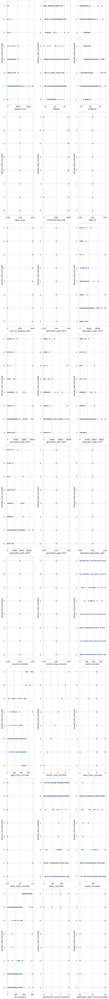

In [30]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.scatterplot(colist[x], y='primary_fuel_encoded', data=final_dataframe)
        plt.tight_layout()
    except ValueError:
        continue

# It can be visualized from above scatter plots against outcome vector that 

## 1. distribution is mostly evenly distributed for most of the columns. For example, 

        other fuel 3

        commissioning year

        wepp_id

        year of capacity data

        generation gwh 2013

        generation gwh 2019

        estimated generation gwh

        country encoded

        country long encoded

        other fuel 1 encoded

        other fuel 2 encoded

        generation data source encoded
        
# Encoding Explained
    Codes:
    array([6., 1., 7., 2., 3., 0., 5., 4.])
    Original fuel names:
    array(['Solar', 'Coal', 'Wind', 'Gas', 'Hydro', 'Biomass', 'Oil',
           'Nuclear'], dtype=object)        
 

# Anomalies:

## 1. Coal observed Maximum Electricity generation whereas Biomass observed the least.

## 2. Hydro was observed in most of the geolocations (latitude and longitude) followed by solar.

## 3. Solar, coal and wind are only primary fuels found prior to 1930.

## 4. From 2014 till 2018, coal has been dominant fuel type.

## 5. Gppd Idnr is even evenly spread between coal and gas.

## 6. Gppd Idnr is maximum for wind.

## 7. Solar followed by Biomass appeared in most number of url


# Q&A Answered:

## 1. How many energy source used in primary electricity generation or export: 8

## 2. How many other types of fuel are included: 3

## 3. Which other type of fuel has max sub category and name those: other fuel 1, oil; cogeneration and gas.

## 4. Which sub category appeared most number of times in other fuel 1: oil

## 5. Name 2 geolocation sources used in the dataset: WRI and Industry About.

## 6. What has been the maximum electrical generating capacity: 4760 mw

## 7. What are most popular fuels on the web: Solar followed by Biomass

## 8. How many fuels have dual generation data source: 5

## 9. Name the power plant that has maximum owners: Solar

## 10. What is the estimated generation growth in 2019: 0

# Value Count Of all Primary Fuels.

In [32]:
data['primary_fuel_encoded'].value_counts()

1.0    258
3.0    251
6.0    127
7.0    123
2.0     69
0.0     50
5.0     20
4.0      9
Name: primary_fuel_encoded, dtype: int64

# Verbal Translation Of Above Value Counts

# Anomalies Detected: 
1. Of 8 primary fuels, 1 occured 258 times.
2. Fuel: Nuclear occured least number of times (9 times).

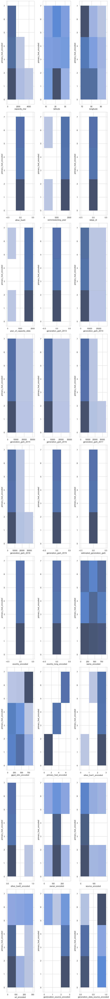

In [65]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.histplot(x=colist[x], y='primary_fuel_encoded', data=final_dataframe, bins=3)
        plt.tight_layout()
    except ValueError:
        continue

# The above histograms show frequency distribution of features against label. It is divided into 3 bins. Only Latitude, generation data source and primary fuel seem to be close to normal with skewness threshold within +/-0.65. Normal distribution has 0 skewness. 
## 1. The entire dataframe against primary fuel encoded has skewness 0.47 and kurtosis -1.2, indicating high abnormalities with primary fuel encoded as label. It reflects right skewed and platykurtic data.

## 2. 5 columns have 0 skewness (as desired in normal distribution):

        other_fuel3                  

        wepp_id                      

        generation_gwh_2013          

        generation_gwh_2019          

        estimated_generation_gwh     

## 3. Moderate skewness is observed in owner encoded.

## 4. High skewness is observed in other fuel 2 encoded.

# Action Plan From Above Anomalies:

    1. Requires outliers removal and transformation to save adequately informative data for predictive development.

    2. Requires data scaling to normalize the existing columns and hence removing abnormally widespread data points.

# Q&A Answered:

## 1. Range of electricity generation in gigawatt-hours reported from year 2015 to 2018: 0 to 30000

## 2. Range of electricity generation in gigawatt-hours reported for the year 2014: 0 to 20000

## 3. Range of electricity generation in gigawatt-hours reported for the year 2013: -0.5 to 0.5

## 4. Range of genration of data source encoded: 0 to 1

## 5. Range of  electrical generating capacity in megawatts: 0 to 6000

# Correlation Analysis

# Mathematical Notation:
Correlation (X, Y) = (Covariance Of X and Covariance Of Y)/(Std Of X and Std Of Y)

In [68]:
final_dataframe.corr()

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
capacity_mw,1.000000,0.047730,0.182568,NaN,0.059484,NaN,0.033288,NaN,0.514890,0.517197,...,0.060240,-0.335742,-0.380395,0.619434,-0.003731,0.078694,-0.242122,-0.243830,0.214951,-0.495833
latitude,0.047730,1.000000,0.039206,NaN,0.070585,NaN,0.060131,NaN,0.043602,0.035606,...,-0.137651,-0.094507,0.001606,0.042557,-0.032308,-0.041281,0.059511,-0.119912,-0.185790,-0.082018
longitude,0.182568,0.039206,1.000000,NaN,0.023288,NaN,0.016784,NaN,0.046575,0.034361,...,0.008285,-0.388721,-0.351525,0.292444,-0.005611,0.056510,-0.235219,-0.312709,0.253406,-0.386174
other_fuel3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
commissioning_year,0.059484,0.070585,0.023288,NaN,1.000000,NaN,0.992470,NaN,0.048559,0.053309,...,-0.125668,-0.079934,-0.077945,0.066377,0.002614,-0.010013,0.010072,-0.058143,0.017233,-0.073444
wepp_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
year_of_capacity_data,0.033288,0.060131,0.016784,NaN,0.992470,NaN,1.000000,NaN,0.038202,0.037936,...,-0.114770,-0.083631,-0.059677,0.033289,0.002211,-0.008425,-0.000973,-0.054670,0.021315,-0.065899
generation_gwh_2013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
generation_gwh_2014,0.514890,0.043602,0.046575,NaN,0.048559,NaN,0.038202,NaN,1.000000,0.953546,...,0.113099,-0.006571,-0.143979,0.276992,-0.000871,-0.020940,-0.041490,-0.057284,0.075811,-0.050692
generation_gwh_2015,0.517197,0.035606,0.034361,NaN,0.053309,NaN,0.037936,NaN,0.953546,1.000000,...,0.101821,0.015933,-0.114108,0.261529,-0.002102,-0.018489,-0.012674,-0.042799,0.034576,-0.021024


# The above table represents correlation among dataset. 
There seems some multicollinearity due to presence of capacity_mw and genration data source encoded; other fuel 1 encoded and genration data source; and capacity_mw and generation growth 2014 to 2018.

Apart from this, there seems moderate multicollinearity among features.

## Action Plan:
I will do further eda on capacity_mw to gauge to weight biasness caused by it against its label explanation capacity.

# Graphical Translation Of Above Table

<AxesSubplot:>

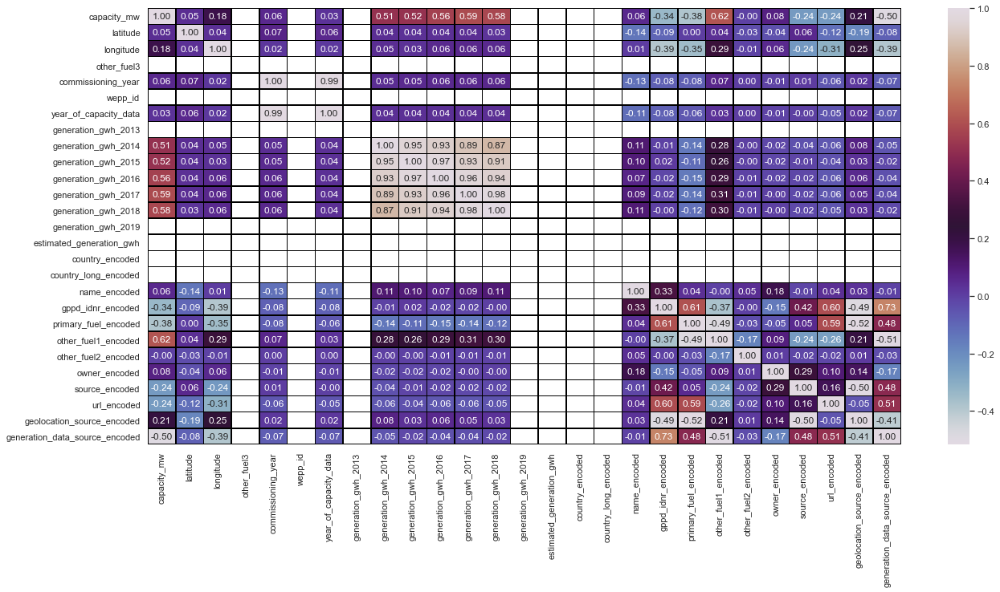

In [70]:
plt.figure(figsize=(21,10))
sns.heatmap(data.corr(), annot=True, linewidths=0.5, linecolor='black', fmt='.2f', cmap='twilight')

# Verbal Translation Of Above Graph:
# 1. Label has weak negative to strong negative relationship with these features:

        geolocation_source_encoded       

        other_fuel1_encoded             

        capacity_mw                      

        longitude                       

        generation_gwh_2016              

        generation_gwh_2014              

        generation_gwh_2017              

        generation_gwh_2018              

        generation_gwh_2015              

        commissioning_year              

        year_of_capacity_data            

        owner_encoded                   

        other_fuel2_encoded              

# 2. Label has weak positive to strong positive relationship with these features in this heatmap:

        latitude                          

        name_encoded                      

        source_encoded                    

        generation_data_source_encoded    

        url_encoded                       

        gppd_idnr_encoded                 

        other_fuel3                            

        wepp_id                                

        generation_gwh_2013                    

        generation_gwh_2019                    

        estimated_generation_gwh               

        country_encoded                        

        country_long_encoded                   


# 3. Strong Multicollinearity is detected among 8 features:
    capacity_mw
    
    genration data source encoded
    
    other fuel 1 encoded
    
    generation growth 2014 to 2018


# 4. Multicollinearity seems to be moderate among all other data points.

In [71]:
# Graphical Representation Of Correlation Of Features With Label


In [72]:
import cufflinks as cf
cf.set_config_file(offline=True)
pd.DataFrame((final_dataframe.corr()['primary_fuel_encoded'])).iplot(title='Correlation Of Variables With Label')

# The above iplot represents correlation of features with label. Correlation of features with label is of high relevance. The stronger the relationship of label with axis, the more accurate the prediction. In the above line graph:

# 1. Highest correlation with label is observed to be 60.92%, that is shared with Large Bags. Minimum correlation is the white area that does not display values, shared with:

    other_fuel3                            

    wepp_id                                

    generation_gwh_2013                    

    generation_gwh_2019                    

    estimated_generation_gwh               

    country_encoded                        

    country_long_encoded                   

# 2. Weak Negative to Strong Negative Relationship Is Found With Following Features:

        geolocation_source_encoded       -0.515922

        other_fuel1_encoded              -0.485250

        capacity_mw                      -0.380395

        longitude                        -0.351525

        generation_gwh_2016              -0.150259

        generation_gwh_2014              -0.143979

        generation_gwh_2017              -0.143411

        generation_gwh_2018              -0.122668

        generation_gwh_2015              -0.114108

        commissioning_year               -0.077945

        year_of_capacity_data            -0.059677

        owner_encoded                    -0.054904

        other_fuel2_encoded              -0.032156

# 3. Weak Positive To Strong Positive Relationship Is Found With Following Features:

        latitude                          0.001606
        name_encoded                      0.040753
        source_encoded                    0.053613
        generation_data_source_encoded    0.482339
        url_encoded                       0.589886
        gppd_idnr_encoded                 0.609180
        primary_fuel_encoded              1.000000
        other_fuel3                            NaN
        wepp_id                                NaN
        generation_gwh_2013                    NaN
        generation_gwh_2019                    NaN
        estimated_generation_gwh               NaN
        country_encoded                        NaN
        country_long_encoded                   NaN


# 4. Correlation Of Label with itself is of no relevance

# Data Handling Conclusion Of Correlation


# Overall correlation among dataset, There seems some multicollinearity due to presence of capacity_mw; genration data source encoded; other fuel 1 encoded; generation growth 2014 to 2018; that show strong correlation a,omg each other. Other than these columns there seems modest collinearity among features. We will do further eda before arriving at a conclusion to delete these columns.

# 1. The most useful feature is gppd_idnr_encoded, apart from this, there seems modest correlation of features with label.

# 2. As a conclusion, we will do further cause and effect analysis based on skewness and distribution plots to conclude if we want to remove multicollinarity causing column:

## i. Capacity MW
    
# 3. Highest Bias (Multicollinearity) is observed in Capacity MW.

# Q&A Answered
## 1. Most useful feature for prediction: gppd_isnr_encoded
## 2. Most bias causing feature: Capacity MW

# Dataset Information Table


In [75]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 907 entries, 0 to 906
Data columns (total 27 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   capacity_mw                     907 non-null    float64
 1   latitude                        907 non-null    float64
 2   longitude                       907 non-null    float64
 3   other_fuel3                     907 non-null    float64
 4   commissioning_year              907 non-null    float64
 5   wepp_id                         907 non-null    float64
 6   year_of_capacity_data           907 non-null    float64
 7   generation_gwh_2013             907 non-null    float64
 8   generation_gwh_2014             907 non-null    float64
 9   generation_gwh_2015             907 non-null    float64
 10  generation_gwh_2016             907 non-null    float64
 11  generation_gwh_2017             907 non-null    float64
 12  generation_gwh_2018             907 

# The above table reprents information dataset:
    
    i. Columns

    ii. Count Of Non Null Data Points

    iii. Values data type for each columns

    iv. Count of data types in iii.

    v. Memory Usage

   # It can be deduced that the dataset has 18249 rows and each columns has no missing values. 
The datatypes used are float64. There 27 float64 columns. Memory usage is 191.4 KB.

# Names of all the columns

In [77]:
data.select_dtypes(include = [np.number]).columns

Index(['capacity_mw', 'latitude', 'longitude', 'other_fuel3',
       'commissioning_year', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'estimated_generation_gwh', 'country_encoded',
       'country_long_encoded', 'name_encoded', 'gppd_idnr_encoded',
       'primary_fuel_encoded', 'other_fuel1_encoded', 'other_fuel2_encoded',
       'owner_encoded', 'source_encoded', 'url_encoded',
       'geolocation_source_encoded', 'generation_data_source_encoded'],
      dtype='object')

# The above code cell highlights all numeric values, that will be used to derive following graphs.

# Box Plot To Detect Outliers

In [86]:
import plotly.express as px
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
import time
for x in colist:
    try:
        plot = px.box(data_frame=final_dataframe, x=x, y='primary_fuel_encoded')
        plot.show()
    except ValueError:
        print('{} : Values Are Outside Scaling Region, try using skewness function to detect outlier'.format(x))        
        continue

# Verbal Translation Of Above Graph
1. The data seems to be biased, as analyzed above, exaple, geolocation encoded, etcetera. Hence, we will go through descriptive stats for further analysis.

# Descriptive Statistics

In [88]:
description=final_dataframe.describe()
description

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
count,907.000000,907.000000,907.000000,907.0,907.000000,907.0,907.000000,907.0,907.000000,907.000000,...,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000
mean,326.223755,21.236458,77.512804,0.0,1988.507166,0.0,2010.095921,0.0,2173.545415,2282.569781,...,453.000000,453.000000,3.206174,2.210584,0.001103,155.998897,43.847850,94.469680,2.576626,0.504961
std,590.085456,6.227400,5.039222,0.0,133.424494,0.0,133.857419,0.0,3788.852233,4006.855958,...,261.972645,261.972645,2.280652,0.421260,0.033204,51.387600,44.642818,70.381222,1.020445,0.500251
min,0.000000,8.168900,68.644700,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16.725000,16.899050,74.261750,0.0,1988.000000,0.0,2019.000000,0.0,237.058750,188.114700,...,226.500000,226.500000,1.000000,2.000000,0.000000,165.000000,22.000000,58.000000,3.000000,0.000000
50%,59.200000,21.837600,76.719500,0.0,2001.000000,0.0,2019.000000,0.0,730.807600,701.027250,...,453.000000,453.000000,3.000000,2.000000,0.000000,165.000000,22.000000,58.000000,3.000000,1.000000
75%,385.250000,25.499450,79.445550,0.0,2011.000000,0.0,2019.000000,0.0,2640.782925,3130.484000,...,679.500000,679.500000,6.000000,2.000000,0.000000,165.000000,29.500000,115.500000,3.000000,1.000000
max,4760.000000,34.649000,95.408000,0.0,2018.000000,0.0,2019.000000,0.0,28127.000000,30539.000000,...,906.000000,906.000000,7.000000,3.000000,1.000000,280.000000,190.000000,303.000000,3.000000,1.000000


In [89]:
lst=description.columns.to_list()
print(lst)

['capacity_mw', 'latitude', 'longitude', 'other_fuel3', 'commissioning_year', 'wepp_id', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018', 'generation_gwh_2019', 'estimated_generation_gwh', 'country_encoded', 'country_long_encoded', 'name_encoded', 'gppd_idnr_encoded', 'primary_fuel_encoded', 'other_fuel1_encoded', 'other_fuel2_encoded', 'owner_encoded', 'source_encoded', 'url_encoded', 'geolocation_source_encoded', 'generation_data_source_encoded']


In [90]:
lst1=[]
for x in range(len(lst)):
    lst1.append([description.iloc[6,x]-description.iloc[5,x]])
len(lst1), print(lst1)

[[326.05], [3.661850000000001], [2.7260500000000008], [0.0], [10.0], [0.0], [0.0], [0.0], [1909.9753249999999], [2429.45675], [2266.1410294999996], [2624.17], [2394.362], [0.0], [0.0], [0.0], [0.0], [226.5], [226.5], [3.0], [0.0], [0.0], [0.0], [7.5], [57.5], [0.0], [0.0]]


(27, None)

In [91]:
lst1_frame=pd.DataFrame(data=lst1, index=lst, columns=['IQR'])
lst1_frame=lst1_frame.T
lst1_frame

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
IQR,326.05,3.66185,2.72605,0.0,10.0,0.0,0.0,0.0,1909.975325,2429.45675,...,226.5,226.5,3.0,0.0,0.0,0.0,7.5,57.5,0.0,0.0


In [92]:
lst3=[]
for x in range(len(lst)):
    lst3.append([description.iloc[7,x]-description.iloc[3,x]])
len(lst3), print(lst3)

[[4760.0], [26.4801], [26.7633], [0.0], [2018.0], [0.0], [2019.0], [0.0], [28127.0], [30539.0], [30015.0], [35116.0], [35136.0], [0.0], [0.0], [0.0], [0.0], [906.0], [906.0], [7.0], [3.0], [1.0], [280.0], [190.0], [303.0], [3.0], [1.0]]


(27, None)

In [93]:
lst3_frame=pd.DataFrame(data=lst3, index=lst, columns=['Range'])
lst3_frame=lst3_frame.T
lst3_frame

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
Range,4760.0,26.4801,26.7633,0.0,2018.0,0.0,2019.0,0.0,28127.0,30539.0,...,906.0,906.0,7.0,3.0,1.0,280.0,190.0,303.0,3.0,1.0


In [94]:
lst5=pd.DataFrame(data=final_dataframe.skew().to_list(), index=lst, columns=['Skewness'])
lst5=lst5.T
lst6=pd.DataFrame(data=final_dataframe.kurtosis().to_list(), index=lst, columns=['Kurtosis'])
lst6=lst6.T
lst5, lst6

(          capacity_mw  latitude  longitude  other_fuel3  commissioning_year  \
 Skewness     3.123576 -0.156725   1.139937          0.0          -14.646106   
 
           wepp_id  year_of_capacity_data  generation_gwh_2013  \
 Skewness      0.0             -14.983214                  0.0   
 
           generation_gwh_2014  generation_gwh_2015  ...  name_encoded  \
 Skewness             3.968135             4.189005  ...           0.0   
 
           gppd_idnr_encoded  primary_fuel_encoded  other_fuel1_encoded  \
 Skewness                0.0              0.472251             1.109169   
 
           other_fuel2_encoded  owner_encoded  source_encoded  url_encoded  \
 Skewness            30.116441       -0.88949        1.827373     1.510537   
 
           geolocation_source_encoded  generation_data_source_encoded  
 Skewness                   -2.078834                        -0.01988  
 
 [1 rows x 27 columns],
           capacity_mw  latitude  longitude  other_fuel3  commissioning_ye

# Outcome Table Of Descriptive Statistics

In [96]:
description1=pd.concat([description, lst1_frame, lst3_frame, lst5, lst6])
description1

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
count,907.000000,907.000000,907.000000,907.0,907.000000,907.0,907.000000,907.0,907.000000,907.000000,...,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000
mean,326.223755,21.236458,77.512804,0.0,1988.507166,0.0,2010.095921,0.0,2173.545415,2282.569781,...,453.000000,453.000000,3.206174,2.210584,0.001103,155.998897,43.847850,94.469680,2.576626,0.504961
std,590.085456,6.227400,5.039222,0.0,133.424494,0.0,133.857419,0.0,3788.852233,4006.855958,...,261.972645,261.972645,2.280652,0.421260,0.033204,51.387600,44.642818,70.381222,1.020445,0.500251
min,0.000000,8.168900,68.644700,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16.725000,16.899050,74.261750,0.0,1988.000000,0.0,2019.000000,0.0,237.058750,188.114700,...,226.500000,226.500000,1.000000,2.000000,0.000000,165.000000,22.000000,58.000000,3.000000,0.000000
50%,59.200000,21.837600,76.719500,0.0,2001.000000,0.0,2019.000000,0.0,730.807600,701.027250,...,453.000000,453.000000,3.000000,2.000000,0.000000,165.000000,22.000000,58.000000,3.000000,1.000000
75%,385.250000,25.499450,79.445550,0.0,2011.000000,0.0,2019.000000,0.0,2640.782925,3130.484000,...,679.500000,679.500000,6.000000,2.000000,0.000000,165.000000,29.500000,115.500000,3.000000,1.000000
max,4760.000000,34.649000,95.408000,0.0,2018.000000,0.0,2019.000000,0.0,28127.000000,30539.000000,...,906.000000,906.000000,7.000000,3.000000,1.000000,280.000000,190.000000,303.000000,3.000000,1.000000
IQR,326.050000,3.661850,2.726050,0.0,10.000000,0.0,0.000000,0.0,1909.975325,2429.456750,...,226.500000,226.500000,3.000000,0.000000,0.000000,0.000000,7.500000,57.500000,0.000000,0.000000
Range,4760.000000,26.480100,26.763300,0.0,2018.000000,0.0,2019.000000,0.0,28127.000000,30539.000000,...,906.000000,906.000000,7.000000,3.000000,1.000000,280.000000,190.000000,303.000000,3.000000,1.000000


# Graphical Representation Of Above Table


In [98]:
final_dataframe.columns

Index(['capacity_mw', 'latitude', 'longitude', 'other_fuel3',
       'commissioning_year', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'estimated_generation_gwh', 'country_encoded',
       'country_long_encoded', 'name_encoded', 'gppd_idnr_encoded',
       'primary_fuel_encoded', 'other_fuel1_encoded', 'other_fuel2_encoded',
       'owner_encoded', 'source_encoded', 'url_encoded',
       'geolocation_source_encoded', 'generation_data_source_encoded'],
      dtype='object')

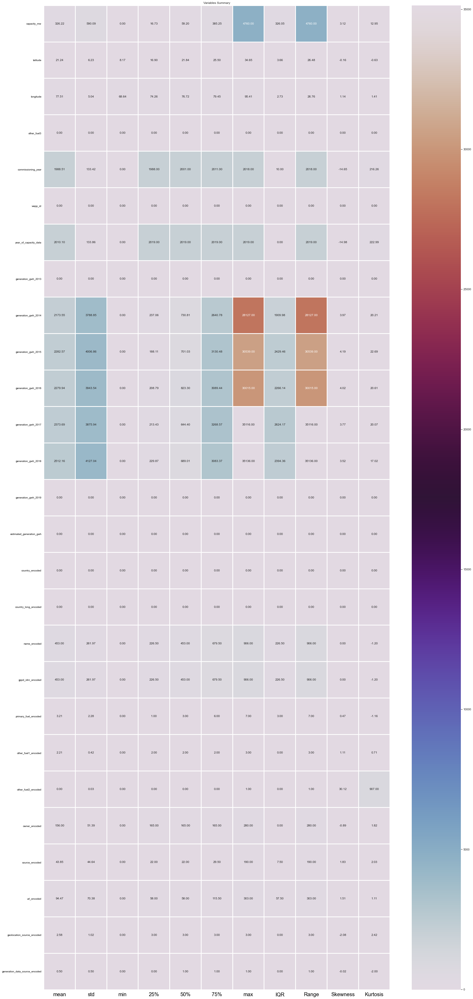

In [99]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,70))
sns.heatmap(round(description1[1:].transpose(),2), linewidth=2, annot=True, fmt='.2f', square=False, cmap='twilight')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=10, color='black')
plt.title('Variables Summary')
plt.show()

# Mathematical Notation:
1. Mean = sum of values/count of values                                                                                     
2. std = sqrt(((value - mean of distribution)**2 / number of values ))                                                                                        
3. 3 quartile are measures of variance, calculated to spot the placeholder value, it returns index of the produced value.
Step 1: sort the dataset                                                                                                   
Step2:                                                                                                                     
i) Lower Quartile (Q1: 25% distribution) = ((number of values+1)/4)th Term                                                 
ii) Middle Quartile (Q2: 50% distribution) = ((number of values +1)/2)th Term                                               
Also, know as median (central value).                                                                                       
iii) Upper Quartile (Q3: 75% distribution) = ¾(number of values + 1)th Term                                                 
iv) IQR = Upper Quartile - Lowe Quartile                                                                                   
4. Range = Maximum Value - Minimum Value                                                                                   
5. Skewness = (sumation(value - mean of distribution)**3)/((number of values - 1) * std**3)                                 
6. Kurtosis = number of values * ((sumation(value - mean of distribution)**4) / std**4)

# Verbal Translation Of Descriptive Table And Graphic
1. For values that are scaled upto 1, mean is mostly around 0 and standard deviation is comparatively low. Hence, making the data much more acceptable by algorithms to process it more accurately.

2. The entire dataset ranges from 0 till 35136.0.

3. IQR, Range and Skewness and kurtosis are much more condensed in data that is scaled upto 1.

4. Skewness is 0 and within +/- 0.65 for:

    1. The entire dataframe against primary fuel encoded has skewness 0.47 and kurtosis -1.2, indicating high abnormalities with primary fuel encoded as label. It reflects right skewed and platykurtic data.
    2. 5 columns have 0 skewness (as desired in normal distribution):
        other_fuel3                  

        wepp_id                      

        generation_gwh_2013          

        generation_gwh_2019          

        estimated_generation_gwh     
    3. Moderate skewness is observed in owner encoded.
    4. High skewness is observed in other fuel 2 encoded.

5. Acceptable skewness is +/- 0.65 and skewness for bell shaped curve should be 0.

6. Kutosis is upto 3 for most dataset, indicating platykurtic curves.

7. Kurtosis is greater than 3, indicating, leptokurtic curve for:

    capacity_mw                        12.946415

    generation_gwh_2018                17.022446

    generation_gwh_2017                20.073581

    generation_gwh_2014                20.211254

    generation_gwh_2016                20.608400

    generation_gwh_2015                22.691761

    commissioning_year                216.258299

    year_of_capacity_data             222.988405

    other_fuel2_encoded               907.000000

8. Kurtosis for bell shaped curve should be 3.

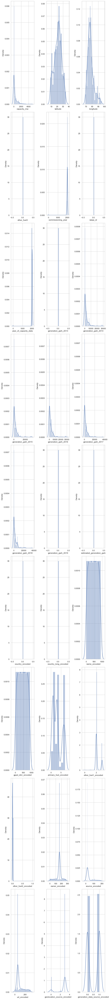

In [100]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.distplot(final_dataframe[colist[x]])
        plt.tight_layout()
    except ValueError:
        continue

# Observations

# 1. Acceptable skewness is +/-0.65 and Correct skewness for bell shaped curve is 0


# 2. Acceptable And Outliers Prone Right Skewness is observed in:

        primary_fuel_encoded               0.472251

        other_fuel1_encoded                1.109169

        longitude                          1.139937

        url_encoded                        1.510537

        source_encoded                     1.827373

        capacity_mw                        3.123576

        generation_gwh_2018                3.521353

        generation_gwh_2017                3.766337

        generation_gwh_2014                3.968135

        generation_gwh_2016                4.019353

        generation_gwh_2015                4.189005

        other_fuel2_encoded               30.116441


# 3. Bell Shaped Curve (O skewness) is observed in:

        gppd_idnr_encoded                  0.000000

        name_encoded                       0.000000
        
        country_long_encoded               0.000000
        
        country_encoded                    0.000000
        
        estimated_generation_gwh           0.000000
        
        generation_gwh_2019                0.000000
        
        generation_gwh_2013                0.000000
        
        wepp_id                            0.000000
        
        other_fuel3                        0.000000
        
# 4. Acceptable And Outliers Prone Left Skewness is observed in:
        
        year_of_capacity_data            -14.983214
        
        commissioning_year               -14.646106
        
        geolocation_source_encoded        -2.078834
        
        owner_encoded                     -0.889490
        
        latitude                          -0.156725
        
        generation_data_source_encoded    -0.019880
        

# Conclusion:

# Based On EDA done above in two parts, I will do f test and ptest on these biased columns:

1. Capacity MW (Multicollinearity and skewness).

2. Year Of Capacity Data (Skewness and Kurtosis)

3. Other Fuel 2 Encoded (Skewness and Kurtosis)


# Error Removal And Data Handling


# ANOVA Test On Selected Features
## Ftest score should be greater than 1 and p value should be less than 0.05, to determine to keep these features for further analysis

# Columns1: Capacity MW

In [39]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['capacity_mw'], final_dataframe['primary_fuel_encoded'])
f,p

(271.78363276984385, 5.301284211732813e-57)

In [38]:
final_dataframe.columns

Index(['capacity_mw', 'latitude', 'longitude', 'other_fuel3',
       'commissioning_year', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'estimated_generation_gwh', 'country_encoded',
       'country_long_encoded', 'name_encoded', 'gppd_idnr_encoded',
       'primary_fuel_encoded', 'other_fuel1_encoded', 'other_fuel2_encoded',
       'owner_encoded', 'source_encoded', 'url_encoded',
       'geolocation_source_encoded', 'generation_data_source_encoded'],
      dtype='object')

# Column 2: Year Of Capacity Data

In [40]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['year_of_capacity_data'], final_dataframe['primary_fuel_encoded'])
f,p

(203818.3901561421, 0.0)

# Column 3: Other Fuel 2 Encoded

In [41]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['other_fuel2_encoded'], final_dataframe['primary_fuel_encoded'])
f,p

(1790.9051810322771, 9.732085845890152e-273)

Error Removal And Data Handling
Based on above analysis:
1. There are no outliers in the data.
2. Strong multicolliearity features are important for prediction because there f test and p value are acceptable. This means that the amount of multicollineaity is insignificant and removing the feature will lower explanatory capacity of the model.
3. Extereme leptokurtic and right skewed features are also relatively significant based on f test and p test.
4. Extreme platykurtic and left skewed features are also relatively significant based on f test and p test.


## Hence, as a solution, feature scaling will do a better job in explaining the dependent variable than removing whole columns.

## Prior to feature scaling, I will put the features through vif test and outliers transformation for better training of the model.


In [104]:
# The above table represents final dataframe that will go through machine learning  techniques of outliers treatment

In [105]:
# Z Score: Outliers Treatment

In [106]:
import numpy as np
from scipy.stats import stats
from sklearn.preprocessing import StandardScaler
final_dataframe[np.isinf(final_dataframe)] = 0
scaled = StandardScaler()
final_dataframe=final_dataframe.fillna(method='ffill')
scaled.fit(final_dataframe)
scaled_data = scaled.transform(final_dataframe)
score=np.abs(stats.zscore(scaled_data))
score.shape

(907, 27)

In [107]:
#threshold=(-3,3)
threshold=3
print(np.where(score>3))

(array([ 13,  13,  14,  14,  15,  15,  15,  71,  80, 143, 147, 178, 179,
       183, 191, 209, 244, 299, 308, 308, 308, 308, 308, 321, 332, 333,
       340, 345, 360, 363, 364, 364, 364, 364, 364, 364, 375, 404, 416,
       427, 482, 489, 489, 489, 489, 489, 490, 490, 490, 490, 490, 491,
       491, 491, 491, 491, 492, 492, 492, 492, 492, 493, 493, 493, 493,
       493, 493, 494, 494, 494, 494, 494, 494, 519, 577, 638, 648, 648,
       648, 648, 648, 648, 657, 657, 657, 657, 657, 657, 661, 669, 689,
       695, 695, 695, 695, 695, 695, 721, 724, 725, 725, 725, 725, 725,
       726, 726, 726, 726, 726, 726, 767, 786, 786, 786, 786, 786, 786,
       788, 807, 807, 807, 807, 807, 808, 808, 808, 808, 808, 808, 811,
       811, 818, 832, 870, 871, 879, 879, 879, 879, 879, 879, 880, 880,
       880, 880, 880, 880, 894, 895, 900, 903, 903, 904, 904, 905, 905,
       906, 906], dtype=int64), array([11, 12, 11, 12,  0, 11, 12, 23, 23,  0,  0,  2,  2,  2, 23,  0,  2,
       23,  0,  8, 10, 11, 1

# The cell above displays outlier values.


In [109]:
len(np.where(score>3)[0])

158

# The cell above shows number of outliers.


In [111]:
data_new=final_dataframe[(score<3).all(axis=1)]
data_new

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded


# The table above shows the final dataframe after removing outliers, 
158 rows are removed and resultant dimension is 0 rows * 27 columns

# IQR Method Of Outliers Removal

# Since, all rows are removed by z method, hence, I will try IQR Method of outliers removal and power transformation method of outliers transformation.

In [117]:
Q1= final_dataframe[final_dataframe.columns].quantile(0.25)
Q3 = final_dataframe[final_dataframe.columns].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR

# The above code calculates IQR as discussed in descriptive statistics section of eda. 
It Upper Limit and Lower Limit of distribution curve.

In [120]:
final_dataframe[(final_dataframe[final_dataframe.columns] < lower_limit) | (final_dataframe[final_dataframe.columns] > upper_limit)] # outliers

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,230.0,109.0,NaN,1.0,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,259.0,174.0,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,205.0,NaN,NaN
3,NaN,NaN,91.3602,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1800.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,1600.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN
903,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,114.0,77.0,NaN,0.0,NaN
904,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,260.0,NaN,NaN
905,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,91.0,59.0,NaN,NaN,NaN


# The above table displays, outliers detected by IQR Method, it displays all values beyond upper and lower limit and places 
NaN on all the values that are significant and within upper and lower limits.

In [122]:
new_df = final_dataframe[(final_dataframe[final_dataframe.columns] > lower_limit) & (final_dataframe[final_dataframe.columns] < upper_limit)]

In [123]:
new_df=new_df.fillna(method='bfill')
new_df

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,2.5,28.1839,73.2407,NaN,2011.0,NaN,NaN,NaN,617.789264,843.747000,...,0.0,657.0,6.0,NaN,NaN,NaN,21.0,128.0,NaN,1.0
1,98.0,24.7663,74.6090,NaN,2004.0,NaN,NaN,NaN,617.789264,843.747000,...,1.0,519.0,1.0,NaN,NaN,NaN,21.0,173.0,NaN,1.0
2,39.2,21.9038,69.3732,NaN,2004.0,NaN,NaN,NaN,617.789264,843.747000,...,2.0,853.0,7.0,NaN,NaN,NaN,21.0,58.0,NaN,1.0
3,135.0,23.8712,82.4091,NaN,2004.0,NaN,NaN,NaN,617.789264,843.747000,...,3.0,0.0,2.0,NaN,NaN,NaN,22.0,58.0,NaN,0.0
4,250.0,21.9603,82.4091,NaN,2015.0,NaN,NaN,NaN,3035.550000,5916.370000,...,4.0,1.0,1.0,NaN,NaN,NaN,22.0,58.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,3.0,16.2949,77.3568,NaN,2016.0,NaN,NaN,NaN,0.000000,0.994875,...,902.0,491.0,1.0,NaN,NaN,NaN,22.0,58.0,NaN,0.0
903,3.0,12.8932,78.1654,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,...,903.0,822.0,6.0,NaN,NaN,NaN,21.0,22.0,NaN,1.0
904,25.5,15.2758,75.5811,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,...,904.0,891.0,7.0,NaN,NaN,NaN,21.0,82.0,NaN,1.0
905,80.0,24.3500,73.7477,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,...,905.0,539.0,1.0,NaN,NaN,NaN,21.0,82.0,NaN,1.0


# The above table displays the final dataframe after IQR  treatment, since this method restores all the rows. 
It signifies that outliers are not very much spread and can be treated with power transform method.

# I prefer Power Transform in this case because outliers are not very significant in particular fuel types.

# It would be prudent to perform outliers transformation of remaining data for better pre processing.

# Vectorization

# I have divided the datset into X and Y vectors by removing label and its transformation from features vector.

Label vector is primary_fuel_encoded.

In [126]:
x=final_dataframe.drop(['primary_fuel_encoded'], axis=1)
y=final_dataframe['primary_fuel_encoded']
x.sample()

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,country_long_encoded,name_encoded,gppd_idnr_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
304,10.25,21.2261,74.2393,0.0,1988.0,0.0,2019.0,0.0,499.9875,410.56685,...,0.0,304.0,823.0,2.0,0.0,111.0,21.0,190.0,3.0,1.0


# The above table displays a sample of features vector.

In [128]:
y.sample()

46    3.0
Name: primary_fuel_encoded, dtype: float64

# The above series displays a sample of label series.


# Outliers Transformation With Power Transform


In [131]:
from sklearn.preprocessing import power_transform
x_array=power_transform(x, method='yeo-johnson')
x_frame=pd.DataFrame(x_array, columns=x.columns)
x_frame

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,country_long_encoded,name_encoded,gppd_idnr_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,-1.695767,1.124459,-0.916031,0.0,0.726883,0.0,0.066556,0.0,-0.148811,0.032070,...,0.0,-2.165615,0.790633,-0.467333,-0.033223,1.633049,1.582861,0.759357,-2.318029,0.990126
1,0.193694,0.558536,-0.517939,0.0,0.351585,0.0,0.066556,0.0,-0.148811,0.032070,...,0.0,-2.146630,0.331335,-0.467333,-0.033223,2.379859,2.036658,1.238398,0.429091,0.990126
2,-0.292337,0.091115,-2.322906,0.0,0.351585,0.0,0.066556,0.0,-0.148811,0.032070,...,0.0,-2.130340,1.397466,-0.467333,-0.033223,-2.408326,-0.471879,1.516759,0.429091,0.990126
3,0.360998,0.411697,2.078270,0.0,0.351585,0.0,0.066556,0.0,-0.148811,0.032070,...,0.0,-2.115584,-2.165615,-0.467333,-0.033223,0.107183,-0.403248,-0.410584,0.429091,-1.009973
4,1.649503,0.100279,1.084051,0.0,0.947453,0.0,0.066556,0.0,0.807409,1.246644,...,0.0,-2.101875,-2.146630,1.789197,-0.033223,0.107183,-0.403248,-0.410584,0.429091,-1.009973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,1.593509,-0.804551,0.159939,0.0,1.003303,0.0,0.066556,0.0,-2.025384,-1.837553,...,0.0,1.542553,0.234021,1.789197,-0.033223,0.107183,-0.403248,-0.410584,0.429091,-1.009973
903,-1.615576,-1.332161,0.332903,0.0,-8.999150,0.0,-15.024979,0.0,-2.025384,-1.945215,...,0.0,1.545490,1.304428,-0.467333,-0.033223,-0.924038,1.211010,-1.674188,-2.403610,0.990126
904,-0.522773,-0.963992,-0.260910,0.0,-8.999150,0.0,-15.024979,0.0,-2.025384,-1.945215,...,0.0,1.548426,1.510186,-0.467333,-0.033223,0.107183,-0.471879,1.917089,0.429091,0.990126
905,0.086915,0.490168,-0.763282,0.0,-8.999150,0.0,-15.024979,0.0,-2.025384,-1.945215,...,0.0,1.551361,0.399915,-0.467333,-0.033223,-1.332026,0.904767,0.085658,0.429091,0.990126


# The above table displays outliers transformed values as discussed above.

In [133]:
x_frame[np.isinf(x_frame)] = 0
x_frame[np.isnan(x_frame)]=0

# In the above cell, I have filled infinite and na values with 0, in case those arose during the process of transformation.

In [137]:
from sklearn.preprocessing import MinMaxScaler
scaled = MinMaxScaler([0,7])
scaled.fit(x_frame)
scaled_data = scaled.transform(x_frame)
scaled_data

array([[1.18312189, 5.20507586, 2.41594093, ..., 5.60282735, 0.21148069,
        7.        ],
       [4.07679241, 4.27406192, 2.97236033, ..., 6.07345474, 7.        ,
        7.        ],
       [3.33244613, 3.5050965 , 0.44953369, ..., 6.34692706, 7.        ,
        7.        ],
       ...,
       [2.97953755, 1.76931251, 3.33161259, ..., 6.74022702, 7.        ,
        7.        ],
       [3.91326297, 4.16158895, 2.62944032, ..., 4.94096057, 7.        ,
        7.        ],
       [2.62252345, 0.4282785 , 3.95668648, ..., 6.64074944, 7.        ,
        7.        ]])

# In the above cell, I have done positive scaling of features to make positive prediction. 
I have taken range of 0 to 7 because that is classification  range, hence, model performance can be sound.

In [140]:
x_frame1=pd.DataFrame(scaled_data, columns=x_frame.columns)

In [141]:
x_frame1.values.max()

7.000000000000002

# Converted array into dataframe with labelled columns and checked maximum value to ensure that no inf values are remaining.

# Variance Inflation Factor

In [144]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(scaled_data, w) for w in range(scaled_data.shape[1])]
vif['Features']=x_frame1.columns
vif=vif.sort_values(ascending=False, by='vif')
vif

,vif,Features
6,240.744509,year_of_capacity_data
4,154.027669,commissioning_year
19,143.625309,other_fuel1_encoded
22,83.850242,source_encoded
10,64.365574,generation_gwh_2016
11,57.049177,generation_gwh_2017
12,50.615429,generation_gwh_2018
9,40.791299,generation_gwh_2015
23,39.702478,url_encoded
0,26.893801,capacity_mw


In [145]:
drop_features=vif[vif['vif']>6]
drop_features

,vif,Features
6,240.744509,year_of_capacity_data
4,154.027669,commissioning_year
19,143.625309,other_fuel1_encoded
22,83.850242,source_encoded
10,64.365574,generation_gwh_2016
11,57.049177,generation_gwh_2017
12,50.615429,generation_gwh_2018
9,40.791299,generation_gwh_2015
23,39.702478,url_encoded
0,26.893801,capacity_mw


In [159]:
#features_lst=drop_features['Features'].values
x_frame11=x_frame1.drop(['year_of_capacity_data', 'other_fuel1_encoded', 'source_encoded', 'generation_gwh_2016', 'generation_gwh_2017', 'commissioning_year', 'url_encoded', 'generation_gwh_2015', 'capacity_mw', 'gppd_idnr_encoded', 'generation_gwh_2014', 'longitude', 'owner_encoded'], axis=1)
X_scaled=np.array(x_frame11)
#x=x.drop(features_lst, axis=1)
new_vif=pd.DataFrame()
new_vif['vif']=[variance_inflation_factor(X_scaled, w) for w in range(X_scaled.shape[1])]
new_vif['Features']=x_frame11.columns
new_vif=new_vif.sort_values(ascending=False, by='vif')
new_vif

,vif,Features
9,4.703362,name_encoded
11,4.496778,geolocation_source_encoded
4,4.324017,generation_gwh_2018
0,3.789749,latitude
12,1.876626,generation_data_source_encoded
10,1.004840,other_fuel2_encoded
1,NaN,other_fuel3
2,NaN,wepp_id
3,NaN,generation_gwh_2013
5,NaN,generation_gwh_2019


# Since, all the vif scores are below 6, I can pass the listed features for feature selection

# Data Handling Conclusion

# Concluding Points:
# 1. As part of data handling, I have transformed features with high outliers (by analyzing box plots, dist plots, variable plot, scatter plots and descriptive plots).                            

# 2. I have removed multicollinearity by analyzing correlation, correlation heatmaps and variance inflation factor.                                                                  
# 3. Hence, the model can be expected to be low bias model.

# Feature Selection


In [163]:
+from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold

In [164]:
x.shape, y.shape

((907, 26), (907,))

In [165]:
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x_frame11,y,test_size=0.30, random_state=100)

# In the above cell, 
I have checked final shape of each vector and splitted the dat ainto 30% test and 70% train with randomness value as 100.

In [166]:
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)

In [167]:
# In the above code, I have put the values in Variance Threshold Filter and transformed those. To ensure low variance, I have taken variance threshold of 0.01.

<AxesSubplot:>

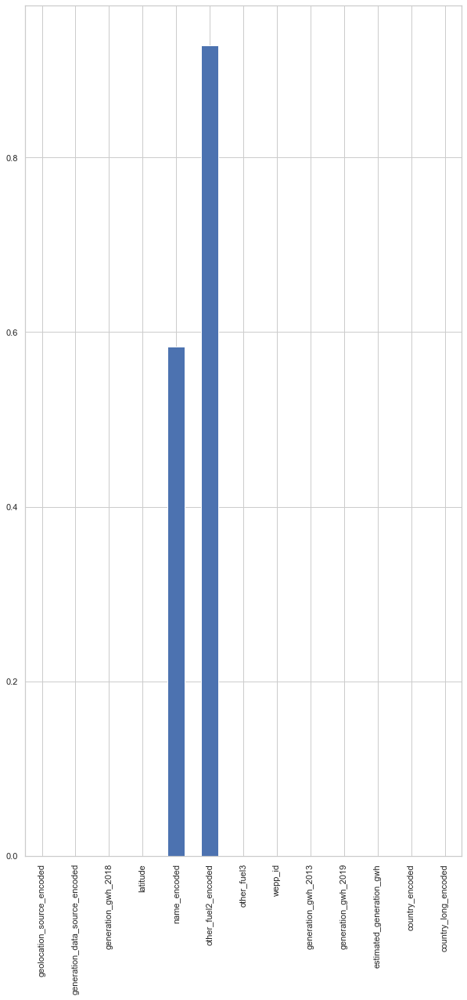

In [168]:
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))

In [169]:
# I have used these transformed values to generate pvalue of each feature (to explain label).

# Mathematical Notation

P Value = (sample proportion - Assumed population proportion in the null hypothesis)/(sqrt((Assumed population proportion in the null hypothesis * ( 1 - Assumed population proportion in the null hypothesis )) / n))

In [171]:
p_values=p_values[p_values<0.05]
p_values.index

Index(['geolocation_source_encoded', 'generation_data_source_encoded',
       'generation_gwh_2018', 'latitude'],
      dtype='object')

# These features strongly impact attrition and control actions are required mainly on these 
to curb the problems around attrition.

# P Values are an important component of feature selection, with significance level set to 0.05, Variance Threshold
    ensemble technique returns with 95% confidence, all the features that have maximum explanatory capacity
For the present dataset features with pvalues with less than 0.05 are:
Index(['geolocation_source_encoded', 'generation_data_source_encoded',
       'generation_gwh_2018', 'latitude'], dtype='object')

In [173]:
import numpy as np
x=x_frame1.copy()
x=x[['geolocation_source_encoded', 'generation_data_source_encoded',
       'generation_gwh_2018', 'latitude']]
x.sample()

,geolocation_source_encoded,generation_data_source_encoded,generation_gwh_2018,latitude
427,7.0,0.0,2.617861,4.225594


# The above table displays a sample of final x vector with features and values finally selected to be used for prediction.

In [175]:
y.sample()

871    1.0
Name: primary_fuel_encoded, dtype: float64

# The above series displays a sample of label.

In [177]:
x.shape, y.shape

((907, 4), (907,))

# The above cell displays final shapes of x and y vectors

In [179]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.6)

In [180]:
x_train.shape, y_train.shape

((362, 4), (362,))

# In the above two cells, I have divided final vectors with train test split technique, in which train data is 40% and test data is 60% to avoid overfitting issue.

# Model Development, Evaluation And Saving (Total Models = 10)

# Selection Reasoning Of Models 1 to 5

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.

Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# The use case assigned revolves around uneven label points hence there
is high probality of not achieving a good fit. Hence, I have tried different ensembele techniques that 
can lower variance and bias and help achieve a goodness of fit. (Just as a reminder,
I have already applied variance threshold of 0.01 to ensure that risk of models is low). 

# The theories in the two cells above explain why I have chosen Model 1, 
Model 2, Model 3, Model 4 and Model 5 for this use case. Model 5 is support vector classifier 
and hence, is again a very powerful 
implementation to prevent illness of fit and make appropriate decision boundaries.

# Model 1

# Random Forest Classifier With Intuitional Hyper Parameter Tuning

In [190]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [191]:
# Model 1 Predictions

In [192]:
model1_prediction_train

,y_train,yhat
261,3.0,3.0
683,1.0,3.0
234,2.0,3.0
581,2.0,3.0
259,2.0,3.0
...,...,...
140,1.0,3.0
801,1.0,3.0
157,1.0,3.0
505,6.0,3.0


In [193]:
model1_prediction_test

,y_test,yhat
113,7.0,3.0
361,0.0,3.0
457,3.0,3.0
336,2.0,3.0
842,1.0,3.0
...,...,...
307,3.0,3.0
531,1.0,3.0
639,3.0,3.0
160,4.0,3.0


In [194]:
# Model 1 Metrics

In [195]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))
#Since risk is low model is low variance and since train score and test score are equivalent, model is low bias too.

Train Score:  0.3
Test Score:  0.26
Train Accuracy Score:  0.3
Test Accuracy Score:  0.26
Cross Validation Score:  0.28
Cross Validation Risk:  0.0


In [196]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.00      0.00      0.00       162
         2.0       0.00      0.00      0.00        46
         3.0       0.26      1.00      0.42       143
         4.0       0.00      0.00      0.00         8
         5.0       0.00      0.00      0.00        12
         6.0       0.00      0.00      0.00        70
         7.0       0.00      0.00      0.00        78

    accuracy                           0.26       545
   macro avg       0.03      0.12      0.05       545
weighted avg       0.07      0.26      0.11       545



In [197]:
print(confusion_matrix(y_test,ytst_pred))

[[  0   0   0  26   0   0   0   0]
 [  0   0   0 162   0   0   0   0]
 [  0   0   0  46   0   0   0   0]
 [  0   0   0 143   0   0   0   0]
 [  0   0   0   8   0   0   0   0]
 [  0   0   0  12   0   0   0   0]
 [  0   0   0  70   0   0   0   0]
 [  0   0   0  78   0   0   0   0]]


In [198]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print(auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [199]:
from sklearn import metrics
y_pred_proba =rfc.predict_proba(x_test)[::,1]
try:
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')

Multi Class Format Is Not Supported For ROC Curve


# Model 2

# Random Forest Classifier With Default Hyper Parameter Tuning

In [203]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [204]:
 # Model 2 Predictions

In [205]:
model2_prediction_train

,y_train,yhat
261,3.0,3.0
683,1.0,1.0
234,2.0,2.0
581,2.0,2.0
259,2.0,2.0
...,...,...
140,1.0,1.0
801,1.0,1.0
157,1.0,1.0
505,6.0,6.0


In [206]:
model2_prediction_test

,y_test,yhat
113,7.0,7.0
361,0.0,7.0
457,3.0,7.0
336,2.0,1.0
842,1.0,1.0
...,...,...
307,3.0,3.0
531,1.0,1.0
639,3.0,3.0
160,4.0,1.0


In [207]:
# Model 2 Metrics

In [208]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  1.0
Test Score:  0.65
Train Accuracy Score:  1.0
Test Accuracy Score:  0.65
Cross Validation Score:  0.67
Cross Validation Risk:  0.03


In [209]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred1))

              precision    recall  f1-score   support

         0.0       0.26      0.35      0.30        26
         1.0       0.67      0.70      0.68       162
         2.0       0.41      0.15      0.22        46
         3.0       0.68      0.71      0.70       143
         4.0       0.00      0.00      0.00         8
         5.0       0.42      0.42      0.42        12
         6.0       0.97      0.99      0.98        70
         7.0       0.56      0.65      0.60        78

    accuracy                           0.65       545
   macro avg       0.50      0.50      0.49       545
weighted avg       0.64      0.65      0.64       545



In [210]:
print(confusion_matrix(y_test, ytst_pred1))

[[  9   5   0   1   0   1   0  10]
 [  4 113   3  26   0   0   0  16]
 [  3  15   7  17   0   3   0   1]
 [  5  17   4 102   0   3   0  12]
 [  0   8   0   0   0   0   0   0]
 [  3   1   3   0   0   5   0   0]
 [  0   0   0   0   0   0  69   1]
 [ 11  10   0   4   0   0   2  51]]


In [211]:
print(confusion_matrix(y_test, ytst_pred1))

[[  9   5   0   1   0   1   0  10]
 [  4 113   3  26   0   0   0  16]
 [  3  15   7  17   0   3   0   1]
 [  5  17   4 102   0   3   0  12]
 [  0   8   0   0   0   0   0   0]
 [  3   1   3   0   0   5   0   0]
 [  0   0   0   0   0   0  69   1]
 [ 11  10   0   4   0   0   2  51]]


In [212]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [213]:
from sklearn import metrics
try:
    y_pred_proba =rfc1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')

Multi Class Format Is Not Supported For ROC Curve


# Model 3

# RFC With Grid Search CV

In [216]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim) #saving the best model
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [217]:
# Model 3 Predictions

In [218]:
model3_prediction_train

,y_train,yhat
261,3.0,3.0
683,1.0,1.0
234,2.0,2.0
581,2.0,2.0
259,2.0,2.0
...,...,...
140,1.0,1.0
801,1.0,1.0
157,1.0,1.0
505,6.0,6.0


In [219]:
# Model 3 Metrics

In [220]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  1.0
Test Score:  0.65
Train Accuracy Score:  1.0
Test Accuracy Score:  0.65


In [221]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'entropy', 'max_features': 'log2', 'n_estimators': 100, 'n_jobs': None, 'oob_score': True, 'warm_start': False}
0.7156012176560121


In [222]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(criterion='entropy', max_features='log2', oob_score=True)


In [223]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.24      0.31      0.27        26
         1.0       0.69      0.70      0.70       162
         2.0       0.42      0.17      0.25        46
         3.0       0.65      0.70      0.67       143
         4.0       0.00      0.00      0.00         8
         5.0       0.30      0.25      0.27        12
         6.0       0.96      0.99      0.97        70
         7.0       0.56      0.65      0.60        78

    accuracy                           0.65       545
   macro avg       0.48      0.47      0.47       545
weighted avg       0.63      0.65      0.63       545

[[  8   5   0   3   0   1   0   9]
 [  3 114   4  25   0   0   0  16]
 [  3  12   8  18   0   3   0   2]
 [  6  19   3 100   0   3   0  12]
 [  0   7   0   1   0   0   0   0]
 [  3   1   4   1   0   3   0   0]
 [  0   0   0   0   0   0  69   1]
 [ 10   8   0   6   0   0   3  51]]


In [224]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [225]:
from sklearn import metrics
try:
    y_pred_proba =best_estim.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')    

Multi Class Format Is Not Supported For ROC Curve


# Model 4

# Bagging Classifier With Grid Search CV Hyper Parameter Tuning

In [229]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [230]:
# Model 4 Predictions

In [231]:
model4_prediction_train

,y_train,yhat
261,3.0,3.0
683,1.0,1.0
234,2.0,2.0
581,2.0,2.0
259,2.0,2.0
...,...,...
140,1.0,1.0
801,1.0,1.0
157,1.0,1.0
505,6.0,6.0


In [232]:
# Model 4 Metrics

In [233]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  1.0
Test Score:  0.66
Train Accuracy Score:  1.0
Test Accuracy Score:  0.66


In [234]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 50, 'oob_score': True, 'random_state': 1000}
0.6907153729071538


In [235]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=50, oob_score=True, random_state=1000)


In [236]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.26      0.35      0.30        26
         1.0       0.70      0.70      0.70       162
         2.0       0.39      0.20      0.26        46
         3.0       0.66      0.71      0.69       143
         4.0       0.00      0.00      0.00         8
         5.0       0.36      0.33      0.35        12
         6.0       1.00      0.97      0.99        70
         7.0       0.58      0.68      0.63        78

    accuracy                           0.66       545
   macro avg       0.49      0.49      0.49       545
weighted avg       0.65      0.66      0.65       545



In [237]:
print(confusion_matrix(y_test, ytst_pred3))

[[  9   5   0   1   0   1   0  10]
 [  3 114   3  27   0   0   0  15]
 [  3  16   9  14   0   3   0   1]
 [  6  15   5 102   0   3   0  12]
 [  0   7   0   1   0   0   0   0]
 [  3   0   4   1   0   4   0   0]
 [  0   1   0   1   0   0  68   0]
 [ 10   6   2   7   0   0   0  53]]


In [238]:
model4_save=pickle.dumps(best_estim1) #saving the best model

In [239]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [49]:
best_estim1=sklearn.ensemble.BaggingClassifier()
from sklearn import metrics
try:
    y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')    

Multi Class Format Is Not Supported For ROC Curve


# Model5


# Support Vector Classifier with sigmoid


In [244]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [245]:
# Model 5 Predictions

In [246]:
y_pred5=pd.DataFrame(clf.predict(x_train), columns=['yhat'])
print('Train Prediction\n')
y_pred5

Train Prediction



,yhat
0,3.0
1,3.0
2,3.0
3,6.0
4,3.0
...,...
357,6.0
358,3.0
359,3.0
360,6.0


In [247]:
ytst_pred5=pd.DataFrame(clf.predict(x_test), columns=['yhat'])
print('Test Prediction\n')
ytst_pred5

Test Prediction



,yhat
0,3.0
1,3.0
2,3.0
3,3.0
4,3.0
...,...
540,3.0
541,3.0
542,3.0
543,3.0


In [248]:
# Model 5 Metrics

In [249]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.41
Test Score:  0.34
Train Accuracy Score:  0.41
Test Accuracy Score:  0.34
Cross Validation Score:  0.28
Cross Validation Risk:  0.0


In [250]:
print(confusion_matrix(y_test, ytst_pred5))

[[  0   0   0  24   0   0   2   0]
 [  0   0   0 132   0   0  30   0]
 [  0   0   0  41   0   0   5   0]
 [  0   4   0 117   0   0  22   0]
 [  0   0   0   8   0   0   0   0]
 [  0   0   0  10   0   0   2   0]
 [  0   0   0   0   0   0  70   0]
 [  0   6   0  34   0   0  38   0]]


In [251]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred5), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [252]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is off for model development.')

Graph cannot be generated because probability is off for model development.


# Resampling, Rescaling And Re Feature Selection And Re Spliting For Model Optimization

# Reasoning Of Applying Resampling and developing models 6 to 10.


# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.
Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# Since, original y vector is highly unsampled, I will do resampling to balance all 54 data points to ensure that alongwith being low on variance, the model is also low on bias. Hence, I can achieve, bias variance trade off.

# Hence, I have developed models 6 to 10 based on rfc, ensemble and svm methods on resampled data

In [258]:
y.value_counts() #original y vector, value counts

1.0    258
3.0    251
6.0    127
7.0    123
2.0     69
0.0     50
5.0     20
4.0      9
Name: primary_fuel_encoded, dtype: int64

0.0    45
2.0    45
7.0    45
3.0    45
5.0    45
1.0    45
4.0    45
6.0    45
Name: primary_fuel_encoded, dtype: int64


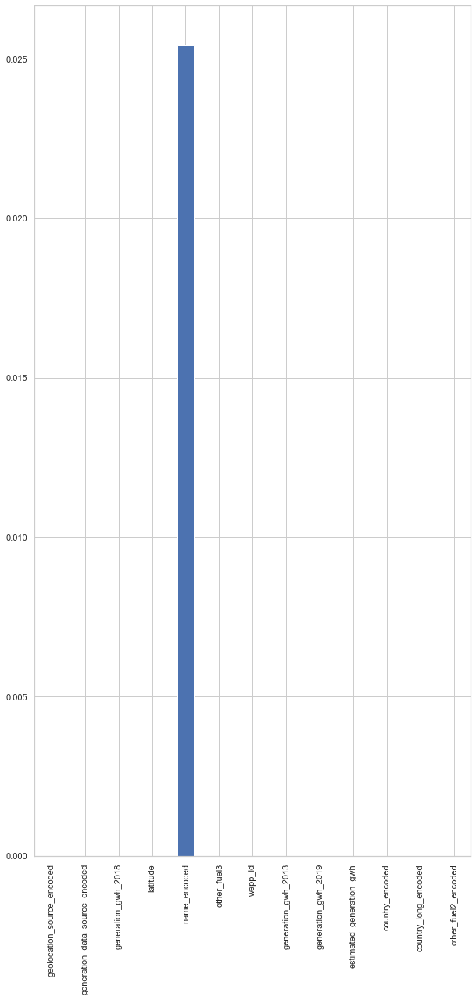

In [259]:
import numpy as np
from sklearn.utils import resample
x=x_frame11.copy()
y=final_dataframe['primary_fuel_encoded']
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)
X=pd.concat([x_train, y_train], axis=1)
not_good=X[X['primary_fuel_encoded']==0]
not_good1=X[X['primary_fuel_encoded']==1]
not_good2=X[X['primary_fuel_encoded']==2]
not_good3=X[X['primary_fuel_encoded']==3]
not_good4=X[X['primary_fuel_encoded']==4]
not_good5=X[X['primary_fuel_encoded']==5]
not_good6=X[X['primary_fuel_encoded']==6]
not_good7=X[X['primary_fuel_encoded']==7]
not_good_upsampled1=resample(not_good7, replace=True, n_samples=len(not_good), random_state=0)
not_good_upsampled2=resample(not_good6, replace=True, n_samples=len(not_good), random_state=0)
not_good_upsampled3=resample(not_good5, replace=True, n_samples=len(not_good), random_state=0)
not_good_upsampled4=resample(not_good4, replace=True, n_samples=len(not_good), random_state=0)
not_good_upsampled5=resample(not_good3, replace=True, n_samples=len(not_good), random_state=0)
not_good_upsampled6=resample(not_good2, replace=True, n_samples=len(not_good), random_state=0)
not_good_upsampled7=resample(not_good1, replace=True, n_samples=len(not_good), random_state=0)
upsampled=pd.concat([not_good, not_good_upsampled1, not_good_upsampled2, not_good_upsampled3, not_good_upsampled4, not_good_upsampled5, not_good_upsampled6, not_good_upsampled7])
x=upsampled.drop('primary_fuel_encoded', axis=1)
y=upsampled['primary_fuel_encoded']
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x,y,test_size=0.1)
print(upsampled['primary_fuel_encoded'].value_counts())
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))
p_values=p_values[p_values<0.05]
p_values=pd.DataFrame(p_values, columns=['P Values'])
p_values['Features']=p_values.index
p_values=p_values[['Features', 'P Values']]
x=x[p_values['Features']]
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)

In [260]:
# The above matrix represent balanced label vector with count of each region enlisted with region code. And the graph shoows new set of strong indicators based on p values, with variance threshold as low as 0.01 and confidence as 95%.

In [261]:
p_values

,Features,P Values
geolocation_source_encoded,geolocation_source_encoded,1.786864e-158
generation_data_source_encoded,generation_data_source_encoded,2.729453e-68
generation_gwh_2018,generation_gwh_2018,5.604106e-15
latitude,latitude,1.141946e-06
name_encoded,name_encoded,2.541114e-02


# Model 6

# RFC On Resampled Data With Intuitional Hyper Parameter Tuning

In [264]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [265]:
# Model 6 Predictions

In [266]:
model1_prediction_train

,y_train,yhat
583,3.0,0.0
176,5.0,0.0
443,4.0,0.0
321,0.0,0.0
160,4.0,0.0
...,...,...
517,0.0,0.0
819,0.0,0.0
808,1.0,0.0
117,6.0,0.0


In [267]:
# Model 6 Metrics

In [268]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.13
Test Score:  0.06
Train Accuracy Score:  0.13
Test Accuracy Score:  0.06
Cross Validation Score:  0.12
Cross Validation Risk:  0.0


In [269]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred))
print(confusion_matrix(y_test, ytst_pred))

              precision    recall  f1-score   support

         0.0       0.06      1.00      0.11         2
         1.0       0.00      0.00      0.00         3
         2.0       0.00      0.00      0.00         5
         3.0       0.00      0.00      0.00         6
         4.0       0.00      0.00      0.00         5
         5.0       0.00      0.00      0.00         6
         6.0       0.00      0.00      0.00         5
         7.0       0.00      0.00      0.00         4

    accuracy                           0.06        36
   macro avg       0.01      0.12      0.01        36
weighted avg       0.00      0.06      0.01        36

[[2 0 0 0 0 0 0 0]
 [3 0 0 0 0 0 0 0]
 [5 0 0 0 0 0 0 0]
 [6 0 0 0 0 0 0 0]
 [5 0 0 0 0 0 0 0]
 [6 0 0 0 0 0 0 0]
 [5 0 0 0 0 0 0 0]
 [4 0 0 0 0 0 0 0]]


In [270]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [271]:
from sklearn import metrics
y_pred_proba =rfc.predict_proba(x_test)[::,1]
try:
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')    

Multi Class Format Is Not Supported For ROC Curve


# Model 7

# RFC On Resampled Data With Default Hyper Parameter Tuning

In [276]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [277]:
# Model 7 Predictions

In [278]:
y_pred1

array([3., 5., 4., 0., 4., 5., 5., 3., 3., 1., 4., 4., 0., 2., 7., 0., 5.,
       1., 7., 5., 3., 1., 5., 6., 4., 6., 6., 7., 2., 0., 4., 1., 7., 3.,
       0., 2., 4., 7., 2., 0., 1., 3., 1., 0., 3., 4., 2., 2., 7., 1., 0.,
       3., 6., 0., 4., 3., 0., 7., 0., 6., 1., 2., 0., 7., 5., 0., 7., 5.,
       1., 2., 1., 7., 5., 1., 1., 5., 4., 3., 5., 3., 4., 3., 4., 0., 4.,
       1., 6., 5., 3., 5., 3., 3., 7., 1., 5., 5., 1., 2., 3., 7., 7., 6.,
       5., 0., 0., 0., 2., 4., 1., 7., 1., 6., 4., 0., 2., 5., 6., 7., 3.,
       7., 3., 7., 7., 4., 0., 4., 2., 2., 7., 0., 4., 3., 2., 7., 3., 1.,
       7., 6., 4., 7., 4., 7., 2., 5., 0., 6., 0., 6., 1., 1., 1., 1., 0.,
       4., 2., 2., 7., 5., 4., 4., 0., 4., 2., 1., 3., 3., 5., 1., 4., 0.,
       3., 1., 6., 4., 6., 6., 0., 0., 4., 6., 4., 5., 2., 2., 5., 6., 2.,
       3., 3., 3., 2., 0., 4., 0., 5., 1., 3., 3., 7., 2., 5., 6., 2., 1.,
       6., 0., 2., 5., 2., 2., 3., 7., 6., 5., 6., 2., 3., 0., 0., 2., 0.,
       4., 6., 5., 0., 5.

In [279]:
ytst_pred1

array([4., 2., 0., 6., 3., 0., 0., 5., 2., 7., 3., 5., 6., 5., 3., 5., 2.,
       5., 2., 6., 0., 7., 7., 0., 2., 4., 4., 3., 4., 4., 6., 0., 5., 6.,
       0., 3.])

In [280]:
# Model 7 Metrics

In [281]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  1.0
Test Score:  0.78
Train Accuracy Score:  1.0
Test Accuracy Score:  0.78
Cross Validation Score:  0.78
Cross Validation Risk:  0.04


In [282]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [283]:
from sklearn import metrics
y_pred_proba =rfc1.predict_proba(x_test)[::,1]
try:
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')        

Multi Class Format Is Not Supported For ROC Curve


In [543]:
best_model2=pickle.dumps(rfc1)

# Model 8

# Support Vector Classifier with sigmoid to prevent overfitting on resampled data

In [287]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [288]:
# Model 8 Predictions

In [289]:
y_pred5=clf.predict(x_train)
y_pred5

array([1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 6., 0., 1.,
       1., 1., 0., 0., 1., 1., 6., 1., 6., 6., 0., 1., 1., 1., 0., 6., 1.,
       0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 6.,
       1., 6., 0., 1., 1., 0., 1., 1., 6., 6., 1., 0., 1., 1., 1., 6., 1.,
       0., 1., 1., 0., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1.,
       1., 6., 1., 6., 0., 1., 1., 0., 1., 1., 1., 1., 1., 1., 6., 0., 6.,
       1., 0., 0., 1., 1., 1., 0., 0., 1., 6., 1., 0., 1., 0., 6., 6., 1.,
       0., 1., 0., 0., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 6., 1., 1.,
       0., 6., 1., 1., 1., 0., 1., 1., 0., 6., 0., 6., 1., 1., 0., 1., 0.,
       1., 1., 1., 0., 1., 1., 1., 0., 1., 1., 0., 1., 1., 1., 1., 1., 1.,
       1., 1., 6., 1., 6., 6., 0., 0., 1., 6., 1., 0., 1., 1., 1., 6., 1.,
       1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 1., 1., 6., 1., 1.,
       6., 0., 1., 0., 1., 1., 6., 6., 6., 0., 6., 1., 1., 0., 0., 6., 0.,
       1., 6., 0., 0., 0.

In [290]:
ytst_pred5=clf.predict(x_test)
ytst_pred5

array([1., 1., 0., 6., 1., 0., 0., 1., 1., 0., 1., 0., 6., 1., 0., 1., 1.,
       1., 1., 6., 0., 6., 1., 0., 1., 1., 1., 1., 1., 1., 6., 1., 1., 6.,
       6., 1.])

In [291]:
# Model 8 Metrics

In [292]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train,y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.31
Test Score:  0.19
Train Accuracy Score:  0.31
Test Accuracy Score:  0.19
Cross Validation Score:  0.12
Cross Validation Risk:  0.0


In [293]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred5))
print(confusion_matrix(y_test,ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.12      0.50      0.20         2
         1.0       0.05      0.33      0.08         3
         2.0       0.00      0.00      0.00         5
         3.0       0.00      0.00      0.00         6
         4.0       0.00      0.00      0.00         5
         5.0       0.00      0.00      0.00         6
         6.0       0.71      1.00      0.83         5
         7.0       0.00      0.00      0.00         4

    accuracy                           0.19        36
   macro avg       0.11      0.23      0.14        36
weighted avg       0.11      0.19      0.13        36

[[1 1 0 0 0 0 0 0]
 [2 1 0 0 0 0 0 0]
 [0 5 0 0 0 0 0 0]
 [3 3 0 0 0 0 0 0]
 [0 5 0 0 0 0 0 0]
 [1 5 0 0 0 0 0 0]
 [0 0 0 0 0 0 5 0]
 [1 1 0 0 0 0 2 0]]


In [294]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is turned off for model development.')

Graph cannot be generated because probability is turned off for model development.


# Model 9

# RFC With Grid Search CV On Resampled Data

In [298]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim) #saving the best model
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [299]:
# Train Prediction

In [300]:
model3_prediction_train

,y_train,yhat
583,3.0,3.0
176,5.0,5.0
443,4.0,4.0
321,0.0,0.0
160,4.0,4.0
...,...,...
517,0.0,0.0
819,0.0,0.0
808,1.0,1.0
117,6.0,6.0


In [301]:
# Test Prediction

In [302]:
model3_prediction_test

,y_test,yhat
510,4.0,4.0
416,2.0,2.0
282,7.0,0.0
153,6.0,6.0
431,3.0,3.0
47,1.0,0.0
47,1.0,0.0
684,5.0,5.0
217,2.0,2.0
286,0.0,7.0


In [ ]:
# Metrics

In [303]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  1.0
Test Score:  0.78
Train Accuracy Score:  1.0
Test Accuracy Score:  0.78


In [304]:
best_parameters, best_score, best_estim

({'bootstrap': True,
  'criterion': 'gini',
  'max_features': 'sqrt',
  'n_estimators': 100,
  'n_jobs': -1,
  'oob_score': True,
  'warm_start': False},
 0.8023557692307695,
 RandomForestClassifier(max_features='sqrt', n_jobs=-1, oob_score=True))

In [305]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.14      0.50      0.22         2
         1.0       0.00      0.00      0.00         3
         2.0       1.00      1.00      1.00         5
         3.0       0.80      0.67      0.73         6
         4.0       1.00      1.00      1.00         5
         5.0       1.00      1.00      1.00         6
         6.0       1.00      1.00      1.00         5
         7.0       0.67      0.50      0.57         4

    accuracy                           0.78        36
   macro avg       0.70      0.71      0.69        36
weighted avg       0.80      0.78      0.78        36

[[1 0 0 0 0 0 0 1]
 [2 0 0 1 0 0 0 0]
 [0 0 5 0 0 0 0 0]
 [2 0 0 4 0 0 0 0]
 [0 0 0 0 5 0 0 0]
 [0 0 0 0 0 6 0 0]
 [0 0 0 0 0 0 5 0]
 [2 0 0 0 0 0 0 2]]


In [306]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [307]:
from sklearn import metrics
try:
    y_pred_proba =best_estim.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')    

Multi Class Format Is Not Supported For ROC Curve


In [542]:
best_model1=pickle.dumps(best_estim)

# Model 10

# Bagging Classifier With Grid Search CV On Resampled Data

In [308]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [ ]:
# Train Prediction

In [309]:
model4_prediction_train

,y_train,yhat
583,3.0,3.0
176,5.0,5.0
443,4.0,4.0
321,0.0,0.0
160,4.0,4.0
...,...,...
517,0.0,0.0
819,0.0,0.0
808,1.0,1.0
117,6.0,6.0


In [310]:
# Test Prediction

In [311]:
model4_prediction_test

,y_test,yhat
510,4.0,4.0
416,2.0,2.0
282,7.0,0.0
153,6.0,6.0
431,3.0,3.0
47,1.0,5.0
47,1.0,5.0
684,5.0,5.0
217,2.0,2.0
286,0.0,7.0


In [312]:
best_parameters1, best_score1, best_estim1

({'bootstrap': True,
  'n_estimators': 100,
  'oob_score': True,
  'random_state': 10000},
 0.8055288461538463,
 BaggingClassifier(n_estimators=100, oob_score=True, random_state=10000))

In [313]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  1.0
Test Score:  0.75
Train Accuracy Score:  1.0
Test Accuracy Score:  0.75


In [314]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.20      0.50      0.29         2
         1.0       0.00      0.00      0.00         3
         2.0       1.00      0.80      0.89         5
         3.0       0.80      0.67      0.73         6
         4.0       0.83      1.00      0.91         5
         5.0       0.75      1.00      0.86         6
         6.0       1.00      1.00      1.00         5
         7.0       0.67      0.50      0.57         4

    accuracy                           0.75        36
   macro avg       0.66      0.68      0.65        36
weighted avg       0.74      0.75      0.73        36



In [315]:
print(confusion_matrix(y_test, ytst_pred3))

[[1 0 0 0 0 0 0 1]
 [0 0 0 1 0 2 0 0]
 [0 0 4 0 1 0 0 0]
 [2 0 0 4 0 0 0 0]
 [0 0 0 0 5 0 0 0]
 [0 0 0 0 0 6 0 0]
 [0 0 0 0 0 0 5 0]
 [2 0 0 0 0 0 0 2]]


In [316]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.


In [317]:
from sklearn import metrics
try:
    y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except ValueError:
    print('Multi Class Format Is Not Supported For ROC Curve')    

Multi Class Format Is Not Supported For ROC Curve


In [50]:
# Best Models are saved in pickle for production

# Conclusion
Best models are.

# Model 7: RFC With Default Hyper Parameter Tuning On Resampled Data

    Train Score:  1.0

    Test Score:  0.78

    Train Accuracy Score:  1.0

    Test Accuracy Score:  0.78

    Cross Validation Score:  0.78

    Cross Validation Risk:  0.04


# Model 9:  RFC With Grid Search CV Hyper Parameter Tuning On Resampled Data

    Train Score:  1.0
    
    Test Score:  0.78
    
    Train Accuracy Score:  1.0
    
    Test Accuracy Score:  0.78

# Please note, metrics calculation is explained above while development and evaluation.

# Credits:
DataTrained and Python Documentations.

# Evaluation Project: Subpart 2

# Global Power Plant Regression Predictive Analysis, Model Development, Model Evaluation and Model Selection Project

# Avocado Project is a regression based problem statement to predict capacity_mw from several indicators. The Database is a comprehensive, open source database of power plants around the world. It centralizes power plant data to make it easier to navigate, compare and draw insights for one’s own analysis. The database covers approximately 35,000 power plants from 167 countries and includes thermal plants (e.g. coal, gas, oil, nuclear, biomass, waste, geothermal) and renewables (e.g. hydro, wind, solar). Each power plant is geolocated and entries contain information on plant capacity, generation, ownership, and fuel type. It will be continuously updated as data becomes available.

# Importing Data From Github repository /wri/global-power-plant-database/blob/master/source_databases_csv/database_IND.csv

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('https://raw.githubusercontent.com/wri/global-power-plant-database/master/source_databases_csv/database_IND.csv')
data1=data.copy()  # creating a copy of dataframe
data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.5,28.1839,73.2407,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.0,24.7663,74.6090,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.2,21.9038,69.3732,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.0,23.8712,91.3602,Gas,NaN,NaN,...,2019.0,NaN,617.789264,843.747000,886.004428,663.774500,626.239128,NaN,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.370000,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,IND,India,YERMARUS TPP,IND0000513,1600.0,16.2949,77.3568,Coal,Oil,NaN,...,2019.0,NaN,NaN,0.994875,233.596650,865.400000,686.500000,NaN,Central Electricity Authority,NaN
903,IND,India,Yelesandra Solar Power Plant,WRI1026222,3.0,12.8932,78.1654,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
904,IND,India,Yelisirur wind power project,WRI1026776,25.5,15.2758,75.5811,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
905,IND,India,ZAWAR MINES,WRI1019901,80.0,24.3500,73.7477,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [2]:
# Observation 1
shape_of_data=data.shape
print('Number Of Rows: ',shape_of_data[0], 'Number Of Columns: ', shape_of_data[1])

Number Of Rows:  907 Number Of Columns:  27


# Data Cleaning

In [4]:
data.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh'],
      dtype='object')

In [5]:
print('Type of storage of data ', type(data), '\nType of data series ', type(data.columns))

Type of storage of data  <class 'pandas.core.frame.DataFrame'> 
Type of data series  <class 'pandas.core.indexes.base.Index'>


In [8]:
data.isna().any()

country                     False
country_long                False
name                        False
gppd_idnr                   False
capacity_mw                 False
latitude                     True
longitude                    True
primary_fuel                False
other_fuel1                  True
other_fuel2                  True
other_fuel3                  True
commissioning_year           True
owner                        True
source                      False
url                         False
geolocation_source           True
wepp_id                      True
year_of_capacity_data        True
generation_gwh_2013          True
generation_gwh_2014          True
generation_gwh_2015          True
generation_gwh_2016          True
generation_gwh_2017          True
generation_gwh_2018          True
generation_gwh_2019          True
generation_data_source       True
estimated_generation_gwh     True
dtype: bool

In [9]:
data.isna().values.any()

True

In [10]:
data.isnull().values.sum()

10445

In [11]:
data_1=data.select_dtypes(object).fillna('None')
data_2=data.select_dtypes(np.number).fillna(method='backfill')
data_2=data_2.fillna(0)
del data
data=pd.concat([data_1, data_2], axis=1)
data.isna().values.any()

False

In [12]:
data.dtypes, len(data.dtypes)

(country                      object
 country_long                 object
 name                         object
 gppd_idnr                    object
 primary_fuel                 object
 other_fuel1                  object
 other_fuel2                  object
 owner                        object
 source                       object
 url                          object
 geolocation_source           object
 generation_data_source       object
 capacity_mw                 float64
 latitude                    float64
 longitude                   float64
 other_fuel3                 float64
 commissioning_year          float64
 wepp_id                     float64
 year_of_capacity_data       float64
 generation_gwh_2013         float64
 generation_gwh_2014         float64
 generation_gwh_2015         float64
 generation_gwh_2016         float64
 generation_gwh_2017         float64
 generation_gwh_2018         float64
 generation_gwh_2019         float64
 estimated_generation_gwh    float64
 

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 907 entries, 0 to 906
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   907 non-null    object 
 1   country_long              907 non-null    object 
 2   name                      907 non-null    object 
 3   gppd_idnr                 907 non-null    object 
 4   primary_fuel              907 non-null    object 
 5   other_fuel1               907 non-null    object 
 6   other_fuel2               907 non-null    object 
 7   owner                     907 non-null    object 
 8   source                    907 non-null    object 
 9   url                       907 non-null    object 
 10  geolocation_source        907 non-null    object 
 11  generation_data_source    907 non-null    object 
 12  capacity_mw               907 non-null    float64
 13  latitude                  907 non-null    float64
 14  longitude 

In [14]:
data.isnull().values.sum()

0

In [15]:
data.dtypes, len(data.dtypes)

(country                      object
 country_long                 object
 name                         object
 gppd_idnr                    object
 primary_fuel                 object
 other_fuel1                  object
 other_fuel2                  object
 owner                        object
 source                       object
 url                          object
 geolocation_source           object
 generation_data_source       object
 capacity_mw                 float64
 latitude                    float64
 longitude                   float64
 other_fuel3                 float64
 commissioning_year          float64
 wepp_id                     float64
 year_of_capacity_data       float64
 generation_gwh_2013         float64
 generation_gwh_2014         float64
 generation_gwh_2015         float64
 generation_gwh_2016         float64
 generation_gwh_2017         float64
 generation_gwh_2018         float64
 generation_gwh_2019         float64
 estimated_generation_gwh    float64
 

# Tabulated Conclusion Of Data Cleaning

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 907 entries, 0 to 906
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   907 non-null    object 
 1   country_long              907 non-null    object 
 2   name                      907 non-null    object 
 3   gppd_idnr                 907 non-null    object 
 4   primary_fuel              907 non-null    object 
 5   other_fuel1               907 non-null    object 
 6   other_fuel2               907 non-null    object 
 7   owner                     907 non-null    object 
 8   source                    907 non-null    object 
 9   url                       907 non-null    object 
 10  geolocation_source        907 non-null    object 
 11  generation_data_source    907 non-null    object 
 12  capacity_mw               907 non-null    float64
 13  latitude                  907 non-null    float64
 14  longitude 

In [17]:
data1=data.copy()

# Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:

1. The dataset had 10445 missing values, that I have filled with default values and backfill methods, where applicable. The dataset does not have missing values now.
2. The whole dataset is of 907 rows *27 columns shape, hence, chances of overerfitting, that is, model getting trained more than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
3. There are 15 continuous columns and 12 categorical columns, hence, encoding is required.

# Dataset Visualization 

# Head View

In [18]:
data.head()

,country,country_long,name,gppd_idnr,primary_fuel,other_fuel1,other_fuel2,owner,source,url,...,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,Solar,None,None,Solar Paces,National Renewable Energy Laboratory,http://www.nrel.gov/csp/solarpaces/project_det...,...,0.0,2019.0,0.0,617.789264,843.747,886.004428,663.774500,626.239128,0.0,0.0
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,Coal,None,None,Ultratech Cement ltd,Ultratech Cement ltd,http://www.ultratechcement.com/,...,0.0,2019.0,0.0,617.789264,843.747,886.004428,663.774500,626.239128,0.0,0.0
2,IND,India,AES Saurashtra Windfarms,WRI1026669,Wind,None,None,AES,CDM,https://cdm.unfccc.int/Projects/DB/DNV-CUK1328...,...,0.0,2019.0,0.0,617.789264,843.747,886.004428,663.774500,626.239128,0.0,0.0
3,IND,India,AGARTALA GT,IND0000001,Gas,None,None,None,Central Electricity Authority,http://www.cea.nic.in/,...,0.0,2019.0,0.0,617.789264,843.747,886.004428,663.774500,626.239128,0.0,0.0
4,IND,India,AKALTARA TPP,IND0000002,Coal,Oil,None,None,Central Electricity Authority,http://www.cea.nic.in/,...,0.0,2019.0,0.0,3035.550000,5916.370,6243.000000,5385.579736,7279.000000,0.0,0.0


# The above table represents first five rows of original dataset


# Sample View


In [19]:
data.sample()

,country,country_long,name,gppd_idnr,primary_fuel,other_fuel1,other_fuel2,owner,source,url,...,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,estimated_generation_gwh
544,IND,India,NORTH CHENNAI EXTENSION,IND0000308,Coal,Oil,None,None,Central Electricity Authority,http://www.cea.nic.in/,...,0.0,2019.0,0.0,5187.0794,6031.9565,5912.396,5447.4697,6284.92,0.0,0.0


# The above table represents a random row as sample row from the dataset


# Tail View

In [20]:
data.tail()

,country,country_long,name,gppd_idnr,primary_fuel,other_fuel1,other_fuel2,owner,source,url,...,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,estimated_generation_gwh
902,IND,India,YERMARUS TPP,IND0000513,Coal,Oil,None,None,Central Electricity Authority,http://www.cea.nic.in/,...,0.0,2019.0,0.0,0.0,0.994875,233.59665,865.4,686.5,0.0,0.0
903,IND,India,Yelesandra Solar Power Plant,WRI1026222,Solar,None,None,Karnataka Power Corporation Limited,Karnataka Power Corporation Limited,http://karnatakapower.com,...,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0
904,IND,India,Yelisirur wind power project,WRI1026776,Wind,None,None,None,CDM,https://cdm.unfccc.int/Projects/DB/TUEV-RHEIN1...,...,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0
905,IND,India,ZAWAR MINES,WRI1019901,Coal,None,None,Hindustan Zinc ltd,Hindustan Zinc ltd,http://www.hzlindia.com/,...,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0
906,IND,India,iEnergy Theni Wind Farm,WRI1026761,Wind,None,None,iEnergy Wind Farms,CDM,https://cdm.unfccc.int/Projects/DB/RWTUV134503...,...,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0


# The above table represents last five rows of the dataframe.

# Feature Engineering

# Encoding

In [21]:
data1=data.copy()

In [22]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
# transform data
result = encoder.fit_transform(data1.select_dtypes(include = [object]))
encoded_data=pd.DataFrame(data=result, columns=data1.select_dtypes(include = [object]).columns+'_'+'encoded')
encoded_data

,country_encoded,country_long_encoded,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,0.0,0.0,0.0,657.0,6.0,2.0,0.0,230.0,109.0,128.0,1.0,1.0
1,0.0,0.0,1.0,519.0,1.0,2.0,0.0,259.0,174.0,173.0,3.0,1.0
2,0.0,0.0,2.0,853.0,7.0,2.0,0.0,2.0,21.0,205.0,3.0,1.0
3,0.0,0.0,3.0,0.0,2.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
4,0.0,0.0,4.0,1.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
902,0.0,0.0,902.0,491.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
903,0.0,0.0,903.0,822.0,6.0,2.0,0.0,114.0,77.0,22.0,0.0,1.0
904,0.0,0.0,904.0,891.0,7.0,2.0,0.0,165.0,21.0,260.0,3.0,1.0
905,0.0,0.0,905.0,539.0,1.0,2.0,0.0,91.0,59.0,82.0,3.0,1.0


# Concatenating Original Data With Encoded Data

In [23]:
data=pd.concat([data1, encoded_data], axis=1, ignore_index=False)
data=data.fillna(0)
data=data.drop(data.select_dtypes(object).columns, axis=1)
data.head()

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,2.5,28.1839,73.2407,0.0,2011.0,0.0,2019.0,0.0,617.789264,843.747,...,0.0,657.0,6.0,2.0,0.0,230.0,109.0,128.0,1.0,1.0
1,98.0,24.7663,74.6090,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747,...,1.0,519.0,1.0,2.0,0.0,259.0,174.0,173.0,3.0,1.0
2,39.2,21.9038,69.3732,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747,...,2.0,853.0,7.0,2.0,0.0,2.0,21.0,205.0,3.0,1.0
3,135.0,23.8712,91.3602,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747,...,3.0,0.0,2.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
4,1800.0,21.9603,82.4091,0.0,2015.0,0.0,2019.0,0.0,3035.550000,5916.370,...,4.0,1.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0


# Saving a copy of dataframe as final_dataframe that will be used further and data will be kept as storage of encoded and raw data.

In [24]:
final_dataframe=data.copy()
final_dataframe

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,2.5,28.1839,73.2407,0.0,2011.0,0.0,2019.0,0.0,617.789264,843.747000,...,0.0,657.0,6.0,2.0,0.0,230.0,109.0,128.0,1.0,1.0
1,98.0,24.7663,74.6090,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747000,...,1.0,519.0,1.0,2.0,0.0,259.0,174.0,173.0,3.0,1.0
2,39.2,21.9038,69.3732,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747000,...,2.0,853.0,7.0,2.0,0.0,2.0,21.0,205.0,3.0,1.0
3,135.0,23.8712,91.3602,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.747000,...,3.0,0.0,2.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
4,1800.0,21.9603,82.4091,0.0,2015.0,0.0,2019.0,0.0,3035.550000,5916.370000,...,4.0,1.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,1600.0,16.2949,77.3568,0.0,2016.0,0.0,2019.0,0.0,0.000000,0.994875,...,902.0,491.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
903,3.0,12.8932,78.1654,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,903.0,822.0,6.0,2.0,0.0,114.0,77.0,22.0,0.0,1.0
904,25.5,15.2758,75.5811,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,904.0,891.0,7.0,2.0,0.0,165.0,21.0,260.0,3.0,1.0
905,80.0,24.3500,73.7477,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,905.0,539.0,1.0,2.0,0.0,91.0,59.0,82.0,3.0,1.0


In [25]:
len(final_dataframe.columns.unique())

27

In [26]:
final_dataframe.isna().values.any()

False

In [27]:
final_dataframe=final_dataframe.fillna(0)
final_dataframe.isna().values.any()

False

# There are no null and missing values in final dataframe.

# EDA Part 1

In [26]:
final_dataframe[:10]

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,2.5,28.1839,73.2407,0.0,2011.0,0.0,2019.0,0.0,617.789264,843.7470,...,0.0,657.0,6.0,2.0,0.0,230.0,109.0,128.0,1.0,1.0
1,98.0,24.7663,74.6090,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.7470,...,1.0,519.0,1.0,2.0,0.0,259.0,174.0,173.0,3.0,1.0
2,39.2,21.9038,69.3732,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.7470,...,2.0,853.0,7.0,2.0,0.0,2.0,21.0,205.0,3.0,1.0
3,135.0,23.8712,91.3602,0.0,2004.0,0.0,2019.0,0.0,617.789264,843.7470,...,3.0,0.0,2.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
4,1800.0,21.9603,82.4091,0.0,2015.0,0.0,2019.0,0.0,3035.550000,5916.3700,...,4.0,1.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
5,250.0,23.7689,68.6447,0.0,2005.0,0.0,2019.0,0.0,1153.421000,1208.8520,...,5.0,2.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0
6,60.0,10.4547,77.0078,0.0,1970.0,0.0,2019.0,0.0,157.558250,152.1952,...,6.0,3.0,3.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
7,192.0,32.2258,77.2070,0.0,2010.0,0.0,2019.0,0.0,674.391100,721.3352,...,7.0,4.0,3.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
8,290.0,16.3300,75.8863,0.0,2004.0,0.0,2019.0,0.0,480.594950,144.4342,...,8.0,5.0,3.0,2.0,0.0,165.0,22.0,58.0,3.0,0.0
9,210.0,23.1642,81.6373,0.0,2008.0,0.0,2019.0,0.0,1887.904000,1643.0460,...,9.0,6.0,1.0,3.0,0.0,165.0,22.0,58.0,3.0,0.0


In [27]:
data1['primary_fuel'].unique()

array(['Solar', 'Coal', 'Wind', 'Gas', 'Hydro', 'Biomass', 'Oil',
       'Nuclear'], dtype=object)

In [29]:
data.corr()['capacity_mw']

capacity_mw                       1.000000
latitude                          0.047730
longitude                         0.182568
other_fuel3                            NaN
commissioning_year                0.059484
wepp_id                                NaN
year_of_capacity_data             0.033288
generation_gwh_2013                    NaN
generation_gwh_2014               0.514890
generation_gwh_2015               0.517197
generation_gwh_2016               0.562674
generation_gwh_2017               0.591648
generation_gwh_2018               0.578107
generation_gwh_2019                    NaN
estimated_generation_gwh               NaN
country_encoded                        NaN
country_long_encoded                   NaN
name_encoded                      0.060240
gppd_idnr_encoded                -0.335742
primary_fuel_encoded             -0.380395
other_fuel1_encoded               0.619434
other_fuel2_encoded              -0.003731
owner_encoded                     0.078694
source_enco

# The above table represents first 10 rows from final dataframe.

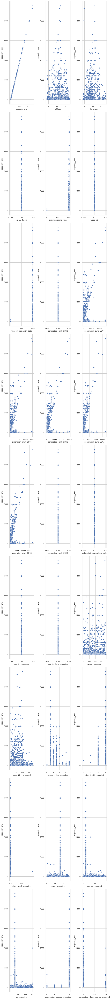

In [368]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.scatterplot(final_dataframe[colist[x]], y='capacity_mw', data=final_dataframe)
        plt.tight_layout()
    except ValueError:
        continue

# It can be visualized from above scatter plots against outcome vector that
1. distribution is mostly unevenly distributed for most of the columns. For example,
    other fuel 3

    commissioning year

    wepp_id

    year of capacity data

    generation gwh 2013

    generation gwh 2019

    estimated generation gwh

    country encoded

    country long encoded

    other fuel 1 encoded

    other fuel 2 encoded

    generation data source encoded
       


Anomalies:

1. Reported information was supplied mainly by Central Electricity Authority.

2. Major geolocation source is WRI.

3. Other Fuel 2 is filled with oil only for one data point in the range 0 to 1000

4. Capacity MW is spread upto 5000 for coal

5. Capacity MW is evenly distributed upto 2000 for Gas and Hydro

6. Capacity MW is widely distributed upto 2000 for Nuclear

7. Oil, solar and wind have major density with 1000 mw

Q&A Answered:
1. How many energy source used in primary electricity generation or export: 8
2. How many other types of fuel are included: 3
3. Which other type of fuel has max sub category and name those: other fuel 1, oil; cogeneration and gas.
4. Which sub category appeared most number of times in other fuel 1: oil
5. Name 2 geolocation sources used in the dataset: WRI and Industry About.
6. What has been the maximum electrical generating capacity: 4760 mw
7. What are most popular fuels on the web: Solar followed by Biomass
8. How many fuels have dual generation data source: 5
9. Name the power plant that has maximum owners: Solar
10. What is the estimated generation growth in 2019: 0

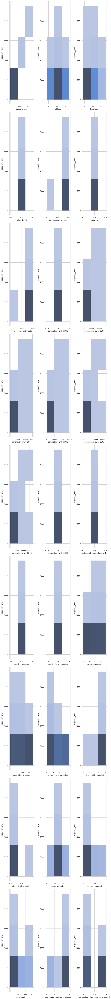

In [370]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.histplot(x=colist[x], y='capacity_mw', data=final_dataframe, bins=3)
        plt.tight_layout()
    except ValueError:
        continue

# The above histograms show frequency distribution of features against label. It is divided into 3 bins. Only Latitude, generation data source and primary fuel seem to be close to normal with skewness threshold within +/-0.65. Normal distribution has 0 skewness.
## 1. The entire dataframe against capacity mw has skewness 3.12 and kurtosis 12.95, indicating high abnormalities with capacity mw as label. It reflects right skewed and leptokurtic data.
## 2. 5 columns have 0 skewness (as desired in normal distribution):
        other_fuel3                  

        wepp_id                      

        generation_gwh_2013          

        generation_gwh_2019          

        estimated_generation_gwh     

## 3. Moderate skewness is observed in owner encoded.
## 4. High skewness is observed in other fuel 2 encoded.
# Action Plan From Above Anomalies:
## 1. Requires outliers removal and transformation to save adequately informative data for predictive development.

## 2. Requires data scaling to normalize the existing columns and hence removing abnormally widespread data points.

# Q&A Answered:
## 1. Range of electricity generation in gigawatt-hours reported from year 2015 to 2018: 0 to 30000
## 2. Range of electricity generation in gigawatt-hours reported for the year 2014: 0 to 20000
## 3. Range of electricity generation in gigawatt-hours reported for the year 2013: -0.5 to 0.5
## 4. Range of genration of data source encoded: 0 to 1
## 5. Range of electrical generating capacity in megawatts: 0 to 6000

# Correlation Analysis

# Mathematical Notation:¶
Correlation (X, Y) = (Covariance Of X and Covariance Of Y)/(Std Of X and Std Of Y)

In [373]:
final_dataframe.corr()

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
capacity_mw,1.000000,0.047730,0.182568,NaN,0.059484,NaN,0.033288,NaN,0.514890,0.517197,...,0.060240,-0.335742,-0.380395,0.619434,-0.003731,0.078694,-0.242122,-0.243830,0.214951,-0.495833
latitude,0.047730,1.000000,0.039206,NaN,0.070585,NaN,0.060131,NaN,0.043602,0.035606,...,-0.137651,-0.094507,0.001606,0.042557,-0.032308,-0.041281,0.059511,-0.119912,-0.185790,-0.082018
longitude,0.182568,0.039206,1.000000,NaN,0.023288,NaN,0.016784,NaN,0.046575,0.034361,...,0.008285,-0.388721,-0.351525,0.292444,-0.005611,0.056510,-0.235219,-0.312709,0.253406,-0.386174
other_fuel3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
commissioning_year,0.059484,0.070585,0.023288,NaN,1.000000,NaN,0.992470,NaN,0.048559,0.053309,...,-0.125668,-0.079934,-0.077945,0.066377,0.002614,-0.010013,0.010072,-0.058143,0.017233,-0.073444
wepp_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
year_of_capacity_data,0.033288,0.060131,0.016784,NaN,0.992470,NaN,1.000000,NaN,0.038202,0.037936,...,-0.114770,-0.083631,-0.059677,0.033289,0.002211,-0.008425,-0.000973,-0.054670,0.021315,-0.065899
generation_gwh_2013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
generation_gwh_2014,0.514890,0.043602,0.046575,NaN,0.048559,NaN,0.038202,NaN,1.000000,0.953546,...,0.113099,-0.006571,-0.143979,0.276992,-0.000871,-0.020940,-0.041490,-0.057284,0.075811,-0.050692
generation_gwh_2015,0.517197,0.035606,0.034361,NaN,0.053309,NaN,0.037936,NaN,0.953546,1.000000,...,0.101821,0.015933,-0.114108,0.261529,-0.002102,-0.018489,-0.012674,-0.042799,0.034576,-0.021024


# The above table represents correlation among dataset. There seems some multicollinearity due to presence of Comissioning Year and year of capacity data; generation growth 14, 15, 16, 17 and 18; gppd_idnr and url encoded, source encoded;primary fuel encoded and url_encoded, geolocation source encoded;  that show strong correlation among each other. Other than these columns there seems modest collinearity among features. We will do further eda before arriving at a conclusion to delete these columns.

# Correlation Heatmap Of Original Dataset

<AxesSubplot:>

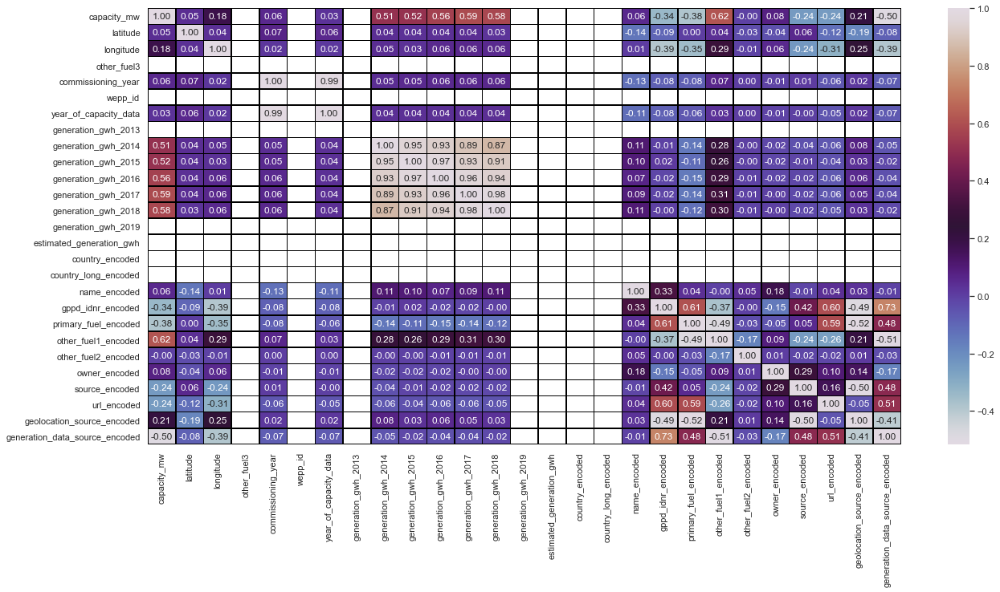

In [376]:
plt.figure(figsize=(21,10))
sns.heatmap(final_dataframe.corr(), annot=True, linewidths=0.5, linecolor='black', fmt='.2f', cmap='twilight')

# Verbal Translation Of Above Graph:
# 1. Label has weak negative to strong negative relationship with these features:

        generation_data_source_encoded   

        primary_fuel_encoded             

        gppd_idnr_encoded                

        url_encoded                      

        source_encoded                   

        other_fuel2_encoded

# 2. Label has weak positive to strong positive relationship with these features in this heatmap:

        year_of_capacity_data             

        latitude                         

        commissioning_year               

        name_encoded                     

        owner_encoded                     

        longitude                         

        geolocation_source_encoded        

        generation_gwh_2014              

        generation_gwh_2015              

        generation_gwh_2016              

        generation_gwh_2018             

        generation_gwh_2017              

        other_fuel1_encoded              

        capacity_mw                       

        other_fuel3                            

        wepp_id                                

        generation_gwh_2013                    

        generation_gwh_2019                    

        estimated_generation_gwh               

        country_encoded                        

        country_long_encoded                   

# 3. Strong Multicollinearity is detected among 5 features:

        Comissioning Year 

        year of capacity data; 

        generation_gwh_2014              

        generation_gwh_2015              

        generation_gwh_2016              

        generation_gwh_2018             

        generation_gwh_2017 

        gppd_idnr and url encoded,

        source encoded;

        primary fuel encoded 

        url_encoded, 

        geolocation source encoded

# 4. Multicollinearity seems to be moderate among all other data points.

# Graphical Representation Of Correlation Of Features With Label

In [378]:
import cufflinks as cf
cf.set_config_file(offline=True)
pd.DataFrame(final_dataframe.corr()['capacity_mw']).iplot(title='Correlation Of Variables With Label')

# The above iplot represents correlation of features with label. Correlation of features with label is of high relevance. The stronger the relationship of label with axis, the more accurate the prediction. In the above line graph:
# 1. Highest correlation with label is observed to be 61.94%, that is shared with other fuel1 encoded. Minimum correlation is -0.37%, shared with other fuel 2 encoded.
# 2. Weak Negative To Strong Negative Relationship Is Found With Following Features:

        generation_data_source_encoded   -0.495833

        primary_fuel_encoded             -0.380395

        gppd_idnr_encoded                -0.335742

        url_encoded                      -0.243830

        source_encoded                   -0.242122

        other_fuel2_encoded              -0.003731

# 3. Weak Positive To Strong Positive Relationship Is Found With Following Features:

        year_of_capacity_data             0.033288

        latitude                          0.047730

        commissioning_year                0.059484

        name_encoded                      0.060240

        owner_encoded                     0.078694

        longitude                         0.182568

        geolocation_source_encoded        0.214951

        generation_gwh_2014               0.514890

        generation_gwh_2015               0.517197

        generation_gwh_2016               0.562674

        generation_gwh_2018               0.578107

        generation_gwh_2017               0.591648

        other_fuel1_encoded               0.619434

        capacity_mw                       1.000000

        other_fuel3                            NaN

        wepp_id                                NaN

        generation_gwh_2013                    NaN

        generation_gwh_2019                    NaN

        estimated_generation_gwh               NaN

        country_encoded                        NaN

        country_long_encoded                   NaN

# 4. Correlation Of Label with itself is of no relevance

# Overall Conclsuion Of Correlation Analysis

# Overall correlation among dataset. There seems some multicollinearity due to presence of Comissioning Year and year of capacity data; generation growth 14, 15, 16, 17 and 18; gppd_idnr and url encoded, source encoded;primary fuel encoded and url_encoded, geolocation source encoded; that show strong correlation among each other. Other than these columns there seems modest collinearity among features. We will do further eda before arriving at a conclusion to delete these columns.

# 2. As a conclusion, we will do further cause and effect analysis based on skewness and distribution plots to conclude if we want to remove multicollinarity pairs:

    Comissioning Year 

    year of capacity data; 

    generation_gwh_2014              

    generation_gwh_2015              

    generation_gwh_2016              

    generation_gwh_2018             

    generation_gwh_2017 

    gppd_idnr and url encoded,

    source encoded;

    primary fuel encoded 

    url_encoded, 

    geolocation source encoded
    
## Note: Alongwith causing multicollinearity, most of these features are strongly correlated with features. So, it would be useful to study descriptive statistics and vif weight feature importance against bianess caused by it.

# Q&A Answered

##  Highest Bias (Multicollinearity) is observed in Commissiong year.
##  Most useful feature for prediction is other fuel1 encoded


# Dataset Information Table

In [381]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 907 entries, 0 to 906
Data columns (total 27 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   capacity_mw                     907 non-null    float64
 1   latitude                        907 non-null    float64
 2   longitude                       907 non-null    float64
 3   other_fuel3                     907 non-null    float64
 4   commissioning_year              907 non-null    float64
 5   wepp_id                         907 non-null    float64
 6   year_of_capacity_data           907 non-null    float64
 7   generation_gwh_2013             907 non-null    float64
 8   generation_gwh_2014             907 non-null    float64
 9   generation_gwh_2015             907 non-null    float64
 10  generation_gwh_2016             907 non-null    float64
 11  generation_gwh_2017             907 non-null    float64
 12  generation_gwh_2018             907 

# The above table reprents information dataset:
    
i. Columns

ii. Count Of Non Null Data Points

iii. Values data type for each columns

iv. Count of data types in iii.

v. Memory Usage

# It can be deduced that the dataset has 907 rows and each columns has no missing values. The datatypes used are float64. There are 27 float64 columns. Memory usage is 191.4 KB.

# Names of all the columns

In [384]:
final_dataframe.select_dtypes(include = [np.number]).columns

Index(['capacity_mw', 'latitude', 'longitude', 'other_fuel3',
       'commissioning_year', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'estimated_generation_gwh', 'country_encoded',
       'country_long_encoded', 'name_encoded', 'gppd_idnr_encoded',
       'primary_fuel_encoded', 'other_fuel1_encoded', 'other_fuel2_encoded',
       'owner_encoded', 'source_encoded', 'url_encoded',
       'geolocation_source_encoded', 'generation_data_source_encoded'],
      dtype='object')

# The above code cell highlights all numeric values, that will be used to derive following graphs.

# Box Plot To Detect Outliers

In [387]:
import plotly.express as px
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
for x in colist:
    try:
        plot = px.box(data_frame=final_dataframe,x=x, y='capacity_mw')
        plot.show()
    except ValueError:
        print('{0} vales out of range, try skewness function to detect outliers'.format(x))
        continue

# Verbal Translation Of Above Graph¶
The data seems to be biased, as analyzed above, example, other fuel 3, wepp id, year of capacity data, orimary fuel encoded, generation data source encoded, etcetera. Hence, we will go through descriptive stats for further analysis.

# Descriptive Statistics

In [389]:
description=final_dataframe.describe()
description

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
count,907.000000,907.000000,907.000000,907.0,907.000000,907.0,907.000000,907.0,907.000000,907.000000,...,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000
mean,326.223755,21.236458,77.512804,0.0,1988.507166,0.0,2010.095921,0.0,2173.545415,2282.569781,...,453.000000,453.000000,3.206174,2.210584,0.001103,155.998897,43.847850,94.469680,2.576626,0.504961
std,590.085456,6.227400,5.039222,0.0,133.424494,0.0,133.857419,0.0,3788.852233,4006.855958,...,261.972645,261.972645,2.280652,0.421260,0.033204,51.387600,44.642818,70.381222,1.020445,0.500251
min,0.000000,8.168900,68.644700,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16.725000,16.899050,74.261750,0.0,1988.000000,0.0,2019.000000,0.0,237.058750,188.114700,...,226.500000,226.500000,1.000000,2.000000,0.000000,165.000000,22.000000,58.000000,3.000000,0.000000
50%,59.200000,21.837600,76.719500,0.0,2001.000000,0.0,2019.000000,0.0,730.807600,701.027250,...,453.000000,453.000000,3.000000,2.000000,0.000000,165.000000,22.000000,58.000000,3.000000,1.000000
75%,385.250000,25.499450,79.445550,0.0,2011.000000,0.0,2019.000000,0.0,2640.782925,3130.484000,...,679.500000,679.500000,6.000000,2.000000,0.000000,165.000000,29.500000,115.500000,3.000000,1.000000
max,4760.000000,34.649000,95.408000,0.0,2018.000000,0.0,2019.000000,0.0,28127.000000,30539.000000,...,906.000000,906.000000,7.000000,3.000000,1.000000,280.000000,190.000000,303.000000,3.000000,1.000000


In [390]:
lst=description.columns.to_list()
print(lst)

['capacity_mw', 'latitude', 'longitude', 'other_fuel3', 'commissioning_year', 'wepp_id', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018', 'generation_gwh_2019', 'estimated_generation_gwh', 'country_encoded', 'country_long_encoded', 'name_encoded', 'gppd_idnr_encoded', 'primary_fuel_encoded', 'other_fuel1_encoded', 'other_fuel2_encoded', 'owner_encoded', 'source_encoded', 'url_encoded', 'geolocation_source_encoded', 'generation_data_source_encoded']


In [391]:
lst1=[]
for x in range(len(lst)):
    lst1.append([description.iloc[6,x]-description.iloc[5,x]])
len(lst1), print(lst1)

[[326.05], [3.661850000000001], [2.7260500000000008], [0.0], [10.0], [0.0], [0.0], [0.0], [1909.9753249999999], [2429.45675], [2266.1410294999996], [2624.17], [2394.362], [0.0], [0.0], [0.0], [0.0], [226.5], [226.5], [3.0], [0.0], [0.0], [0.0], [7.5], [57.5], [0.0], [0.0]]


(27, None)

In [392]:
lst1_frame=pd.DataFrame(data=lst1, index=lst, columns=['IQR'])
lst1_frame=lst1_frame.T
lst1_frame

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
IQR,326.05,3.66185,2.72605,0.0,10.0,0.0,0.0,0.0,1909.975325,2429.45675,...,226.5,226.5,3.0,0.0,0.0,0.0,7.5,57.5,0.0,0.0


In [393]:
lst3=[]
for x in range(len(lst)):
    lst3.append([description.iloc[7,x]-description.iloc[3,x]])


In [394]:
lst3_frame=pd.DataFrame(data=lst3, index=lst, columns=['Range'])
lst3_frame=lst3_frame.T
lst3_frame

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
Range,4760.0,26.4801,26.7633,0.0,2018.0,0.0,2019.0,0.0,28127.0,30539.0,...,906.0,906.0,7.0,3.0,1.0,280.0,190.0,303.0,3.0,1.0


In [395]:
lst5=pd.DataFrame(data=final_dataframe.skew().to_list(), index=lst, columns=['Skewness'])
lst5=lst5.T
lst6=pd.DataFrame(data=final_dataframe.kurtosis().to_list(), index=lst, columns=['Kurtosis'])
lst6=lst6.T
lst5, lst6

(          capacity_mw  latitude  longitude  other_fuel3  commissioning_year  \
 Skewness     3.123576 -0.156725   1.139937          0.0          -14.646106   
 
           wepp_id  year_of_capacity_data  generation_gwh_2013  \
 Skewness      0.0             -14.983214                  0.0   
 
           generation_gwh_2014  generation_gwh_2015  ...  name_encoded  \
 Skewness             3.968135             4.189005  ...           0.0   
 
           gppd_idnr_encoded  primary_fuel_encoded  other_fuel1_encoded  \
 Skewness                0.0              0.472251             1.109169   
 
           other_fuel2_encoded  owner_encoded  source_encoded  url_encoded  \
 Skewness            30.116441       -0.88949        1.827373     1.510537   
 
           geolocation_source_encoded  generation_data_source_encoded  
 Skewness                   -2.078834                        -0.01988  
 
 [1 rows x 27 columns],
           capacity_mw  latitude  longitude  other_fuel3  commissioning_ye

In [396]:
description1=pd.concat([description, lst1_frame, lst3_frame, lst5, lst6])
description1

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
count,907.000000,907.000000,907.000000,907.0,907.000000,907.0,907.000000,907.0,907.000000,907.000000,...,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000,907.000000
mean,326.223755,21.236458,77.512804,0.0,1988.507166,0.0,2010.095921,0.0,2173.545415,2282.569781,...,453.000000,453.000000,3.206174,2.210584,0.001103,155.998897,43.847850,94.469680,2.576626,0.504961
std,590.085456,6.227400,5.039222,0.0,133.424494,0.0,133.857419,0.0,3788.852233,4006.855958,...,261.972645,261.972645,2.280652,0.421260,0.033204,51.387600,44.642818,70.381222,1.020445,0.500251
min,0.000000,8.168900,68.644700,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16.725000,16.899050,74.261750,0.0,1988.000000,0.0,2019.000000,0.0,237.058750,188.114700,...,226.500000,226.500000,1.000000,2.000000,0.000000,165.000000,22.000000,58.000000,3.000000,0.000000
50%,59.200000,21.837600,76.719500,0.0,2001.000000,0.0,2019.000000,0.0,730.807600,701.027250,...,453.000000,453.000000,3.000000,2.000000,0.000000,165.000000,22.000000,58.000000,3.000000,1.000000
75%,385.250000,25.499450,79.445550,0.0,2011.000000,0.0,2019.000000,0.0,2640.782925,3130.484000,...,679.500000,679.500000,6.000000,2.000000,0.000000,165.000000,29.500000,115.500000,3.000000,1.000000
max,4760.000000,34.649000,95.408000,0.0,2018.000000,0.0,2019.000000,0.0,28127.000000,30539.000000,...,906.000000,906.000000,7.000000,3.000000,1.000000,280.000000,190.000000,303.000000,3.000000,1.000000
IQR,326.050000,3.661850,2.726050,0.0,10.000000,0.0,0.000000,0.0,1909.975325,2429.456750,...,226.500000,226.500000,3.000000,0.000000,0.000000,0.000000,7.500000,57.500000,0.000000,0.000000
Range,4760.000000,26.480100,26.763300,0.0,2018.000000,0.0,2019.000000,0.0,28127.000000,30539.000000,...,906.000000,906.000000,7.000000,3.000000,1.000000,280.000000,190.000000,303.000000,3.000000,1.000000


In [397]:
# Graphical Representation Of Above Table

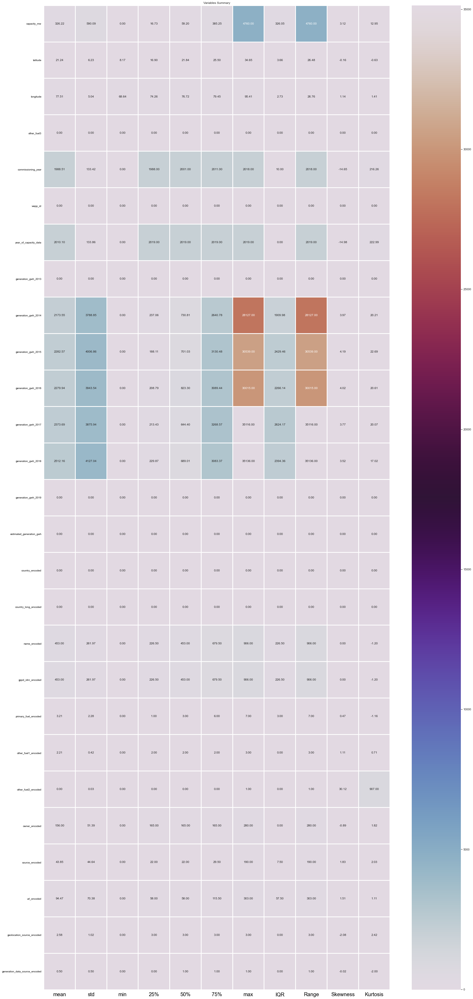

In [400]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,70))
sns.heatmap(round(description1[1:].transpose(),2), linewidth=2, annot=True, fmt='.2f', square=False, color='Black',  cmap='twilight')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=10, color='black')
plt.title('Variables Summary')
plt.show()

# Mathematical Notation:
1. Mean = sum of values/count of values                                                                                     
2. std = sqrt(((value - mean of distribution)**2 / number of values ))                                                                                        
3. 3 quartile are measures of variance, calculated to spot the placeholder value, it returns index of the produced value.
Step 1: sort the dataset                                                                                                   
Step2:                                                                                                                     
i) Lower Quartile (Q1: 25% distribution) = ((number of values+1)/4)th Term                                                 
ii) Middle Quartile (Q2: 50% distribution) = ((number of values +1)/2)th Term                                               
Also, know as median (central value).                                                                                       
iii) Upper Quartile (Q3: 75% distribution) = ¾(number of values + 1)th Term                                                 
iv) IQR = Upper Quartile - Lowe Quartile                                                                                   
4. Range = Maximum Value - Minimum Value                                                                                   
5. Skewness = (sumation(value - mean of distribution)**3)/((number of values - 1) * std**3)                                 
6. Kurtosis = number of values * ((sumation(value - mean of distribution)**4) / std**4)

# Verbal Translation Of Descriptive Table And Graphic

1. For values that are scaled upto 1, mean is mostly around 0 and standard deviation is comparatively low. Hence, making the data much more acceptable by algorithms to process it more accurately.

2. The entire dataset ranges from 0 till 35136.0.

3. IQR, Range and Skewness and kurtosis are much more condensed in data that is scaled upto 1.

4. Skewness is 0 and within +/- 0.65 for:

5. The entire dataframe against primary fuel encoded has skewness 0.47 and kurtosis -1.2, indicating high abnormalities with primary fuel encoded as label. It reflects right skewed and platykurtic data.
6. 5 columns have 0 skewness (as desired in normal distribution):
    
    other_fuel3

    wepp_id

    generation_gwh_2013

    generation_gwh_2019

    estimated_generation_gwh

7. Moderate skewness is observed in owner encoded.

8. High skewness is observed in other fuel 2 encoded.

9. Acceptable skewness is +/- 0.65 and skewness for bell shaped curve should be 0.

10. Kutosis is upto 3 for most dataset, indicating platykurtic curves.

11. Kurtosis is greater than 3, indicating, leptokurtic curve for:

    capacity_mw 12.946415

    generation_gwh_2018 17.022446

    generation_gwh_2017 20.073581

    generation_gwh_2014 20.211254

    generation_gwh_2016 20.608400

    generation_gwh_2015 22.691761

    commissioning_year 216.258299

    year_of_capacity_data 222.988405

    other_fuel2_encoded 907.000000

12. Kurtosis for bell shaped curve should be 3.

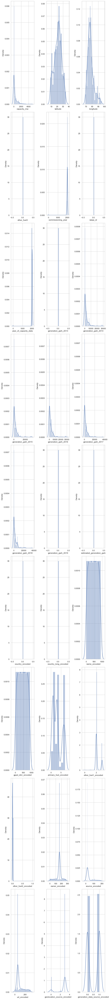

In [402]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.distplot(final_dataframe[colist[x]])
        plt.tight_layout()
    except ValueError:
        continue

# Observations
1. Acceptable skewness is +/-0.65 and Correct skewness for bell shaped curve is 0
2. Acceptable And Outliers Prone Right Skewness is observed in:
    primary_fuel_encoded               0.472251

    other_fuel1_encoded                1.109169

    longitude                          1.139937

    url_encoded                        1.510537

    source_encoded                     1.827373

    capacity_mw                        3.123576

    generation_gwh_2018                3.521353

    generation_gwh_2017                3.766337

    generation_gwh_2014                3.968135

    generation_gwh_2016                4.019353

    generation_gwh_2015                4.189005

    other_fuel2_encoded               30.116441


3. Bell Shaped Curve (O skewness) is observed in:
    gppd_idnr_encoded                  0.000000

    name_encoded                       0.000000

    country_long_encoded               0.000000

    country_encoded                    0.000000

    estimated_generation_gwh           0.000000

    generation_gwh_2019                0.000000

    generation_gwh_2013                0.000000

    wepp_id                            0.000000

    other_fuel3                        0.000000

4. Acceptable And Outliers Prone Left Skewness is observed in:
    year_of_capacity_data            -14.983214

    commissioning_year               -14.646106

    geolocation_source_encoded        -2.078834

    owner_encoded                     -0.889490

    latitude                          -0.156725

    generation_data_source_encoded    -0.019880

# Conclusion:
# Based On EDA done above in two parts, I will do f test and ptest on these biased columns:

Commissioning Year (Multicollinearity and skewness).

Year Of Capacity Data (Skewness and Kurtosis)

Other Fuel 2 Encoded (Skewness and Kurtosis)

# Error Removal And Data Handling
# ANOVA Test On Selected Features
## Ftest score should be greater than 1 and p value should be less than 0.05, to determine to keep these features for further analysis

# Column 1: Commissioning Year

In [28]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['commissioning_year'], final_dataframe['capacity_mw'])
f,p

(6847.512808295706, 0.0)

# Column 2: Year Of Capacity Data

In [29]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['year_of_capacity_data'], final_dataframe['capacity_mw'])
f,p

(7024.309935521138, 0.0)

# Column 3: Other Fuel 2 Encoded

In [30]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['other_fuel2_encoded'], final_dataframe['capacity_mw'])
f,p

(277.2079582023137, 4.98616594994516e-58)

# Error Removal And Data Handling Based on above analysis:

## There are no outliers in the data.
## Strong multicolliearity features are important for prediction because there f test and p value are acceptable. This means that the amount of multicollineaity is insignificant and removing the feature will lower explanatory capacity of the model.
## Extereme leptokurtic and right skewed features are also relatively significant based on f test and p test.
## Extreme platykurtic and left skewed features are also relatively significant based on f test and p test.

# Hence, as a solution, feature scaling will do a better job in explaining the dependent variable than removing whole columns.

# Prior to feature scaling, I will put the features through vif test and outliers transformation for better training of the model.

In [407]:
# The above table represents final dataframe that will go through machine learning  techniques of outliers treatment

In [408]:
# Z Score: Outliers Treatment

In [409]:
import numpy as np
from scipy.stats import stats
from sklearn.preprocessing import StandardScaler
scaled = StandardScaler()
final_dataframe=final_dataframe.fillna(0)
scaled.fit(final_dataframe)
scaled_data = scaled.transform(final_dataframe)
score=np.abs(stats.zscore(scaled_data))
score.shape

(907, 27)

In [410]:
#threshold=(-3,3)
threshold=3
print(np.where(score>3))

(array([ 13,  13,  14,  14,  15,  15,  15,  71,  80, 143, 147, 178, 179,
       183, 191, 209, 244, 299, 308, 308, 308, 308, 308, 321, 332, 333,
       340, 345, 360, 363, 364, 364, 364, 364, 364, 364, 375, 404, 416,
       427, 482, 489, 489, 489, 489, 489, 490, 490, 490, 490, 490, 491,
       491, 491, 491, 491, 492, 492, 492, 492, 492, 493, 493, 493, 493,
       493, 493, 494, 494, 494, 494, 494, 494, 519, 577, 638, 648, 648,
       648, 648, 648, 648, 657, 657, 657, 657, 657, 657, 661, 669, 689,
       695, 695, 695, 695, 695, 695, 721, 724, 725, 725, 725, 725, 725,
       726, 726, 726, 726, 726, 726, 767, 786, 786, 786, 786, 786, 786,
       788, 807, 807, 807, 807, 807, 808, 808, 808, 808, 808, 808, 811,
       811, 818, 832, 870, 871, 879, 879, 879, 879, 879, 879, 880, 880,
       880, 880, 880, 880, 894, 895, 900, 903, 903, 904, 904, 905, 905,
       906, 906], dtype=int64), array([11, 12, 11, 12,  0, 11, 12, 23, 23,  0,  0,  2,  2,  2, 23,  0,  2,
       23,  0,  8, 10, 11, 1

# The above cell displays outlier values.

In [412]:
len(np.where(score>3)[0])

158

# The above cell shows number of outliers.

In [414]:
data_new=final_dataframe[(score<3).all(axis=1)]
data_new

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded


# The above table shows the final dataframe after removing outliers, 168 rows are removed and resultant dimension is 0 rows * 27 columns

# IQR Method Of Outliers Removal

# Since, all rows are removed by z method, hence, I will try IQR Method of outliers removal and power transformation method of outliers transformation.

In [418]:
Q1= final_dataframe[final_dataframe.columns].quantile(0.25)
Q3 = final_dataframe[final_dataframe.columns].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR

In [419]:
# The above code calculates IQR as discussed in descriptive statistics section of eda. It Upper Limit and Lower Limit of distribution curve.

In [420]:
final_dataframe[(final_dataframe[final_dataframe.columns] < lower_limit) | (final_dataframe[final_dataframe.columns] > upper_limit)] # outliers

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,230.0,109.0,NaN,1.0,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,259.0,174.0,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,205.0,NaN,NaN
3,NaN,NaN,91.3602,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1800.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,1600.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN
903,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,114.0,77.0,NaN,0.0,NaN
904,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,260.0,NaN,NaN
905,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,91.0,59.0,NaN,NaN,NaN


# The above table displays, outliers detected by IQR Method, it displays all values beyond upper and lower limit and places NaN on all the values that are significant and within upper and lower limits.

In [422]:
new_df = final_dataframe[(final_dataframe[final_dataframe.columns] > lower_limit) & (final_dataframe[final_dataframe.columns] < upper_limit)]

In [423]:
new_df=new_df.fillna(method='bfill')
new_df

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,2.5,28.1839,73.2407,NaN,2011.0,NaN,NaN,NaN,617.789264,843.747000,...,0.0,657.0,6.0,NaN,NaN,NaN,21.0,128.0,NaN,1.0
1,98.0,24.7663,74.6090,NaN,2004.0,NaN,NaN,NaN,617.789264,843.747000,...,1.0,519.0,1.0,NaN,NaN,NaN,21.0,173.0,NaN,1.0
2,39.2,21.9038,69.3732,NaN,2004.0,NaN,NaN,NaN,617.789264,843.747000,...,2.0,853.0,7.0,NaN,NaN,NaN,21.0,58.0,NaN,1.0
3,135.0,23.8712,82.4091,NaN,2004.0,NaN,NaN,NaN,617.789264,843.747000,...,3.0,0.0,2.0,NaN,NaN,NaN,22.0,58.0,NaN,0.0
4,250.0,21.9603,82.4091,NaN,2015.0,NaN,NaN,NaN,3035.550000,5916.370000,...,4.0,1.0,1.0,NaN,NaN,NaN,22.0,58.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,3.0,16.2949,77.3568,NaN,2016.0,NaN,NaN,NaN,0.000000,0.994875,...,902.0,491.0,1.0,NaN,NaN,NaN,22.0,58.0,NaN,0.0
903,3.0,12.8932,78.1654,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,...,903.0,822.0,6.0,NaN,NaN,NaN,21.0,22.0,NaN,1.0
904,25.5,15.2758,75.5811,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,...,904.0,891.0,7.0,NaN,NaN,NaN,21.0,82.0,NaN,1.0
905,80.0,24.3500,73.7477,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,...,905.0,539.0,1.0,NaN,NaN,NaN,21.0,82.0,NaN,1.0


# The above table displays the final dataframe after IQR  treatment, since this method restores all the rows. It signifies that outliers are not very much spread and can be treated with power transform method.

## I prefer Power Transform in this case because outliers are not very significant in particular fuel types.
## It would be prudent to perform outliers transformation of remaining data for better pre processing.

# Vectorization

# I have divided the datset into X and Y vectors by removing label and its transformation from features vector.

label=capacity_mw

In [430]:
x=final_dataframe.drop(['capacity_mw'], axis=1)
y=final_dataframe['capacity_mw']
x.sample()

,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
830,15.3302,75.5767,0.0,1981.0,0.0,2019.0,0.0,381.95861,306.46,340.33975,...,830.0,897.0,7.0,2.0,0.0,249.0,21.0,249.0,3.0,1.0


# The above table displays a sample of features vector.

In [432]:
y.sample()

816    750.0
Name: capacity_mw, dtype: float64

# The above series displays a sample of label series.

# Outliers Transformation With Power Transform

In [435]:
from sklearn.preprocessing import power_transform
x_array=power_transform(x, method='yeo-johnson')
x_frame=pd.DataFrame(x_array, columns=x.columns)
x_frame

,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,...,name_encoded,gppd_idnr_encoded,primary_fuel_encoded,other_fuel1_encoded,other_fuel2_encoded,owner_encoded,source_encoded,url_encoded,geolocation_source_encoded,generation_data_source_encoded
0,1.124459,-0.916031,0.0,0.726883,0.0,0.066556,0.0,-0.148811,0.032070,0.040011,...,-2.165615,0.790633,1.171313,-0.467333,-0.033223,1.633049,1.582861,0.759357,-2.318029,0.990126
1,0.558536,-0.517939,0.0,0.351585,0.0,0.066556,0.0,-0.148811,0.032070,0.040011,...,-2.146630,0.331335,-0.996291,-0.467333,-0.033223,2.379859,2.036658,1.238398,0.429091,0.990126
2,0.091115,-2.322906,0.0,0.351585,0.0,0.066556,0.0,-0.148811,0.032070,0.040011,...,-2.130340,1.397466,1.441576,-0.467333,-0.033223,-2.408326,-0.471879,1.516759,0.429091,0.990126
3,0.411697,2.078270,0.0,0.351585,0.0,0.066556,0.0,-0.148811,0.032070,0.040011,...,-2.115584,-2.165615,-0.362170,-0.467333,-0.033223,0.107183,-0.403248,-0.410584,0.429091,-1.009973
4,0.100279,1.084051,0.0,0.947453,0.0,0.066556,0.0,0.807409,1.246644,1.294823,...,-2.101875,-2.146630,-0.996291,1.789197,-0.033223,0.107183,-0.403248,-0.410584,0.429091,-1.009973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,-0.804551,0.159939,0.0,1.003303,0.0,0.066556,0.0,-2.025384,-1.837553,-0.585228,...,1.542553,0.234021,-0.996291,1.789197,-0.033223,0.107183,-0.403248,-0.410584,0.429091,-1.009973
903,-1.332161,0.332903,0.0,-8.999150,0.0,-15.024979,0.0,-2.025384,-1.945215,-1.993108,...,1.545490,1.304428,1.171313,-0.467333,-0.033223,-0.924038,1.211010,-1.674188,-2.403610,0.990126
904,-0.963992,-0.260910,0.0,-8.999150,0.0,-15.024979,0.0,-2.025384,-1.945215,-1.993108,...,1.548426,1.510186,1.441576,-0.467333,-0.033223,0.107183,-0.471879,1.917089,0.429091,0.990126
905,0.490168,-0.763282,0.0,-8.999150,0.0,-15.024979,0.0,-2.025384,-1.945215,-1.993108,...,1.551361,0.399915,-0.996291,-0.467333,-0.033223,-1.332026,0.904767,0.085658,0.429091,0.990126


# The above table displays outliers transformed values as discussed above.

In [437]:
x_frame[np.isinf(x_frame)] = 0
x_frame[np.isnan(x_frame)]=0

# In the above cell, I have filled infinite and na values with 0, in case those arose during the process of transformation.

In [445]:
from sklearn.preprocessing import MinMaxScaler
scaled = MinMaxScaler([0,4760])
scaled.fit(x_frame)
scaled_data = scaled.transform(x_frame)
scaled_data

array([[3539.45158465, 1642.83983537,    0.        , ..., 3809.92259599,
         143.80687064, 4760.        ],
       [2906.36210571, 2021.20502211,    0.        , ..., 4129.94922447,
        4760.        , 4760.        ],
       [2383.46561808,  305.68291081,    0.        , ..., 4315.91039897,
        4760.        , 4760.        ],
       ...,
       [1203.13250806, 2265.4965629 ,    0.        , ..., 4583.35437418,
        4760.        , 4760.        ],
       [2829.88048331, 1788.01941854,    0.        , ..., 3359.853186  ,
        4760.        , 4760.        ],
       [ 291.22938119, 2690.5468059 ,    0.        , ..., 4515.70962146,
        4760.        , 4760.        ]])

# In the above cell, I have done positive scaling of features to make positive prediction. I have taken range of 0 to 4760 because that is regression range, hence, model performance can be sound.

In [447]:
x_frame1=pd.DataFrame(scaled_data, columns=x_frame.columns)

In [448]:
x_frame1.values.max()

4760.000000000001

# Converted array into dataframe with labelled columns and checked maximum value to ensure that no inf values are remaining.

In [450]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(scaled_data, w) for w in range(scaled_data.shape[1])]
vif['Features']=x_frame1.columns
vif=vif.sort_values(ascending=False, by='vif')
vif

,vif,Features
5,284.891296,year_of_capacity_data
3,155.066915,commissioning_year
19,130.742340,other_fuel1_encoded
22,90.174094,source_encoded
9,64.344716,generation_gwh_2016
10,57.088241,generation_gwh_2017
11,50.832532,generation_gwh_2018
23,50.143546,url_encoded
8,40.863193,generation_gwh_2015
17,25.214681,gppd_idnr_encoded


In [451]:
drop_features=vif[vif['vif']>6]
drop_features

,vif,Features
5,284.891296,year_of_capacity_data
3,155.066915,commissioning_year
19,130.742340,other_fuel1_encoded
22,90.174094,source_encoded
9,64.344716,generation_gwh_2016
10,57.088241,generation_gwh_2017
11,50.832532,generation_gwh_2018
23,50.143546,url_encoded
8,40.863193,generation_gwh_2015
17,25.214681,gppd_idnr_encoded


In [465]:
#features_lst=drop_features['Features'].values
x_frame11=x_frame1.drop(['year_of_capacity_data','other_fuel1_encoded', 'source_encoded', 'generation_gwh_2016', 'generation_gwh_2017', 'url_encoded', 'commissioning_year', 'generation_gwh_2015', 'gppd_idnr_encoded', 'generation_gwh_2014', 'longitude', 'owner_encoded'] , axis=1)
X_scaled=np.array(x_frame11)
#x=x.drop(features_lst, axis=1)
new_vif=pd.DataFrame()
new_vif['vif']=[variance_inflation_factor(X_scaled, w) for w in range(X_scaled.shape[1])]
new_vif['Features']=x_frame11.columns
new_vif=new_vif.sort_values(ascending=False, by='vif')
new_vif

,vif,Features
9,5.230025,name_encoded
10,4.947521,primary_fuel_encoded
12,4.497550,geolocation_source_encoded
4,4.332297,generation_gwh_2018
0,4.317098,latitude
13,2.402633,generation_data_source_encoded
11,1.005087,other_fuel2_encoded
1,NaN,other_fuel3
2,NaN,wepp_id
3,NaN,generation_gwh_2013


# Since, all the vif scores are below 6, I can pass the listed features for feature selection

# Data Handling Conclusion

# Concluding Points:
# 1. As part of data handling, I have removed features with high outliers (by analyzing box plots, dist plots, variable plot, scatter plots and descriptive plots).
# 2. I have removed multicollinearity by analyzing correlation, correlation heatmaps and variance inflation factor.
# 3. Hence, the model can be expected to be low bias model.

# Feature Selection

In [470]:
from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold

In [471]:
x.shape, y.shape

((907, 26), (907,))

In [472]:
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x_frame11,y,test_size=0.30, random_state=100)

# In the above cell, I have checked final shape of each vector and splitted the data into 30% test and 70% train with randomness value as 100.

In [474]:
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)

# In the above code, I have put the values in Variance Threshold Filter and transformed those.

<AxesSubplot:>

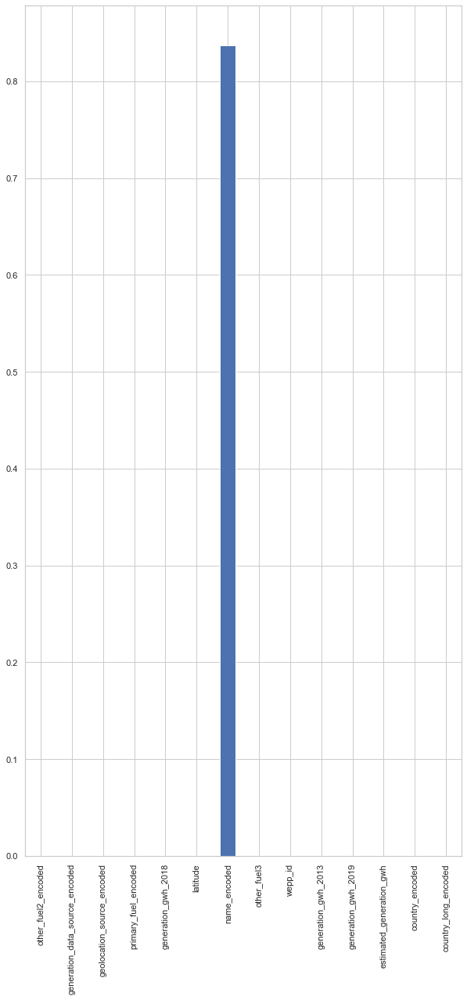

In [476]:
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))

# I have used these transformed values to generate pvalue of each feature (to explain label).

# Mathematical Notation

P Value = (sample proportion - Assumed population proportion in the null hypothesis)/(sqrt((Assumed population proportion in the null hypothesis * ( 1 - Assumed population proportion in the null hypothesis )) / n))

In [479]:
p_values=p_values[p_values<0.05]
p_values.index

Index(['other_fuel2_encoded', 'generation_data_source_encoded',
       'geolocation_source_encoded', 'primary_fuel_encoded',
       'generation_gwh_2018', 'latitude'],
      dtype='object')

# P Values are an important component of feature selection, with significance level set to 0.1, Variance Threshold
    ensemble technique returns with 90% confidence, all the features that have maximum explanatory capacity
For the present dataset features with pvalues with less than 0.1 are:
Index(['other_fuel2_encoded', 'generation_data_source_encoded',
       'geolocation_source_encoded', 'primary_fuel_encoded',
       'generation_gwh_2018', 'latitude'], dtype='object')

In [481]:
import numpy as np
x=x_frame1.copy()
x=x[['other_fuel2_encoded', 'generation_data_source_encoded',
       'geolocation_source_encoded', 'primary_fuel_encoded',
       'generation_gwh_2018', 'latitude']]
x.sample()

,other_fuel2_encoded,generation_data_source_encoded,geolocation_source_encoded,primary_fuel_encoded,generation_gwh_2018,latitude
476,0.0,0.0,4760.0,1340.245221,2676.434727,599.770598


# The above table displays a sample of final x vector with features and values finally selected to be used for prediction.

In [483]:
y.sample()

268    605.0
Name: capacity_mw, dtype: float64

# The above series displays a sample of label.

In [485]:
x.shape, y.shape

((907, 6), (907,))

# The above cell displays final shapes of x and y vectors

In [487]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.6)

In [488]:
x_train.shape, y_train.shape

((362, 6), (362,))

# In the above two cells, I have divided final vectors with train test split technique, in which train data is 40% and test data is 60% to avoid overfitting issue.

# Model Development, Evaluation And Saving (Models =5)


# Selection Reasoning Of Models 1 to 5


# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.

Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# The use case assigned revolves around uneven data points hence there is high probality of not achieving a good fit. Hence, I have tried different ensembele techniques that can lower variance and bias and help achieve a goodness of fit. (Just as a reminder, I have already applied variance threshold of 0.01 to ensure that risk of models is low).

# The theories in the two cells above explain why I have chosen Model 1, Model 2, Model 3, Model 4 and Model 5 for this use case. Model 5 is decision tree regressor and hence, is again a very powerful implementation to prevent illness of fit.

# Model 1

# Extra Tree Regressor With Default HyperParameter Tuning


In [499]:
from sklearn.ensemble import RandomForestRegressor as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error, make_scorer, r2_score
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
import pickle
best_estim=ExtraTreesRegressor()
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
mse2 = mean_squared_error(y_train, y_pred2)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
rmse2=np.sqrt(mse2)
ytst_pred2=best_estim.predict(x_test)
mse_test2=mean_squared_error(y_test, ytst_pred2)
rmse_test2=np.sqrt(mse_test2)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [500]:
print('Train Score: ',np.round(model3_train_score,2))
print('Test Score: ',np.round(model3_test_score,2))
print('MSE Train: ',np.round(mse2,2))
print('RMSE Train: ',np.round(rmse2,2))
print('MSE Test: ',np.round(mse_test2,2))
print('RMSE Train: ',np.round(rmse_test2,2))

Train Score:  1.0
Test Score:  0.83
MSE Train:  169.2
RMSE Train:  13.01
MSE Test:  54311.89
RMSE Train:  233.05


# Model 2

# Random Forest Regressor With Default Hyper Parameter Tuning

In [505]:
from sklearn.ensemble import RandomForestRegressor as el
from sklearn.model_selection import cross_val_score
rfc=el()
rfc.fit(x_train, y_train)
print(rfc.score(x_train, y_train))
print(rfc.score(x_test, y_test))
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
print(scores.std())
print(cv_scores)

0.965014063350895
0.8339443156805452
0.03489028121041875
0.8176306302729245


In [506]:
train_prediction=rfc.predict(x_train)
test_prediction=rfc.predict(x_test)

In [507]:
mse_train = mean_squared_error(y_train, train_prediction)
mse = mean_squared_error(y_test, test_prediction)
rmse_train = np.sqrt(mse_train)
rmse = np.sqrt(mse)
mse_train, mse, rmse_train, rmse

(13249.154834695926, 54233.07950089794, 115.1049731101829, 232.87996801120087)

# Model 3

# Ada Boost Regressor And Random Forest Regressor With Grid Search CV Hyper Parameter Tuning and Ada Boost Boosting

In [511]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error, make_scorer, r2_score
import matplotlib.pyplot as plt
abreg = AdaBoostRegressor()
params = {
 'n_estimators': [50, 100],
 'learning_rate' : [0.01, 0.05, 0.1, 0.5],
 'loss' : ['linear', 'square', 'exponential']
 }
score = make_scorer(mean_squared_error)
print(score)

make_scorer(mean_squared_error)


In [512]:
gridsearch=GridSearchCV(abreg, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
GridSearchCV(cv=5, error_score='raise', estimator=AdaBoostRegressor(base_estimator=rfc, learning_rate=1.0,loss='linear', n_estimators=50, random_state=None), n_jobs=1, param_grid={'n_estimators': [50, 100],'learning_rate': [0.01, 0.05, 0.1, 0.5],'loss': ['linear', 'square', 'exponential']},pre_dispatch='2*n_jobs', refit=True, return_train_score=True,scoring=None, verbose=0) 

GridSearchCV(cv=5, error_score='raise',
             estimator=AdaBoostRegressor(base_estimator=RandomForestRegressor()),
             n_jobs=1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1, 0.5],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': [50, 100]},
             return_train_score=True)

In [513]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'learning_rate': 0.01, 'loss': 'linear', 'n_estimators': 50}
0.7384516115248911


In [514]:
best_estim=gridsearch.best_estimator_
print(best_estim)

AdaBoostRegressor(learning_rate=0.01)


In [515]:
best_estim.fit(x_train,y_train)

ytr_pred=best_estim.predict(x_train)
mse = mean_squared_error(y_train, ytr_pred)
print('Train Score: ', best_estim.score(x_train, y_train))
print('Test score: ', best_estim.score(x_test, y_test))

Train Score:  0.8463139612633729
Test score:  0.8413027274834788


In [516]:
ytst_pred=best_estim.predict(x_test)
print('mse_train', mse)
print('rmse_train', np.sqrt(mse))
mse_test = mean_squared_error(y_test, ytst_pred)
print('mse_test', mse_test)
print('rmse_test', np.sqrt(mse_test))

mse_train 58200.817762149
rmse_train 241.2484564969256
mse_test 51829.853535196446
rmse_test 227.66170853965858


In [541]:
best_model=pickle.dumps(best_estim)

# Model 4

# Extra Trees Regressor With Grid Search CV Hyper Parameter Tuning

In [524]:
import sklearn
abreg = sklearn.ensemble.ExtraTreesRegressor()
params = {
 'n_estimators': [50, 100],
 'max_samples' : [0.01, 0.05, 0.1],
 'bootstrap' : [True],
 'oob_score' : [True],
 'warm_start' : [True],
 'n_jobs'  : [1,-1],
 'random_state' : [0,10,100,1000],
 'criterion' : ['mse','mae'] 
 }
score = make_scorer(mean_squared_error)
print(score)

make_scorer(mean_squared_error)


In [525]:
gridsearch=GridSearchCV(abreg, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'bootstrap': [True], 'criterion': ['mse', 'mae'],
                         'max_samples': [0.01, 0.05, 0.1],
                         'n_estimators': [50, 100], 'n_jobs': [1, -1],
                         'oob_score': [True],
                         'random_state': [0, 10, 100, 1000],
                         'warm_start': [True]},
             return_train_score=True)

In [526]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'mse', 'max_samples': 0.1, 'n_estimators': 50, 'n_jobs': 1, 'oob_score': True, 'random_state': 1000, 'warm_start': True}
0.717586290984114


In [527]:
best_estim=gridsearch.best_estimator_
print(best_estim)

ExtraTreesRegressor(bootstrap=True, max_samples=0.1, n_estimators=50, n_jobs=1,
                    oob_score=True, random_state=1000, warm_start=True)


In [528]:
best_estim.fit(x_train,y_train)

ytr_pred=best_estim.predict(x_train)
yts_pred=best_estim.predict(x_test)
mse = mean_squared_error(y_train, ytr_pred)
print('Train Score: ', best_estim.score(x_train, y_train))
print('Test score: ', best_estim.score(x_test, y_test))
print('mse_train: ', mse)
print('rmse_train', np.sqrt(mse))
mse_test=mean_squared_error(y_test, yts_pred)
print('mse_train: ', mse_test)
print('rmse_train', np.sqrt(mse_test))

Train Score:  0.8014705373679626
Test score:  0.8120969225743063
mse_train:  75182.99755819555
rmse_train 274.1951815006886
mse_train:  61368.34507204591
rmse_train 247.72635118623515


# Model5

# Decision Tree Regressor With Default Hyper Parameter Tuning

In [532]:
from sklearn.tree import DecisionTreeRegressor
tree=DecisionTreeRegressor()
tree.fit(x_train, y_train)

DecisionTreeRegressor()

In [533]:
tree.score(x_test, y_test)

0.737983665970032

In [534]:
ytr_pred=tree.predict(x_train)
yts_pred=tree.predict(x_test)
mse = mean_squared_error(y_train, ytr_pred)
print('Train Score: ', tree.score(x_train, y_train))
print('Test score: ', tree.score(x_test, y_test))
print('mse_train: ', mse)
print('rmse_train', np.sqrt(mse))
mse_test=mean_squared_error(y_test, yts_pred)
print('mse_train: ', mse_test)
print('rmse_train', np.sqrt(mse_test))

Train Score:  0.999553210608798
Test score:  0.737983665970032
mse_train:  169.1988950276243
rmse_train 13.00764755932541
mse_train:  85573.41913477799
rmse_train 292.5293474760746


# Best Model is saved in pickle for production

# Conclusion
# There is 1 Best Models based on mse and rmse scores and best fit:

# Model 3: Ada Boost Regressor And Random Forest Regressor With Grid Search CV Hyper Parameter Tuning and Ada Boost Boosting

    mse_train 58200.817762149

    rmse_train 241.2484564969256

    mse_test 51829.853535196446

    rmse_test 227.66170853965858

# Credits:
DataTrained and Python Documentations.